# Data science project: Estimating hospital stay duration

### 1.0 Imports and set up

In [1]:
# numpy
import numpy as np 
# pandas
import pandas as pd
# plotly
import plotly.express as px
import plotly.graph_objects as go
# seaborn
import seaborn as sns
# scipy
from scipy.stats import chi2_contingency
# sklearn
from sklearn.model_selection import train_test_split
# encoder
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
# imputers
from sklearn.impute import KNNImputer, SimpleImputer
# regressors
from sklearn.dummy import DummyRegressor
from sklearn.linear_model import Lasso, Ridge, LinearRegression, ElasticNet
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.ensemble import ExtraTreesRegressor, RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.neural_network import MLPRegressor
# scalers
from sklearn.preprocessing import RobustScaler, MinMaxScaler, StandardScaler
# others
from sklearn.model_selection import GridSearchCV
from sklearn.inspection import permutation_importance
from sklearn.metrics import mean_squared_error, mean_absolute_error
# pickle
import pickle

pd.set_option("display.max_columns", 300)
pd.set_option("display.max_rows", 300)

### 1.1 Data cleaning and preparation for analysis

In [2]:
# Read and merge files to one df
pasient       = pd.read_csv("raw_data/hospital.csv")
demographic   = pd.read_csv("raw_data/demographic.csv")
severity      = pd.read_json("raw_data/severity.json")
physiological = pd.read_table("raw_data/physiological.txt")
exploded_df   = severity.explode(list(severity.columns[2:])).reset_index(drop=True)
df            = pasient.merge(demographic,   how = "outer" , on = "pasient_id")\
                .merge(physiological, how = "outer" , on = "pasient_id")\
                .merge(exploded_df,   how = "outer" , on = "pasient_id")
df.head()

,pasient_id,sykehusdød,oppholdslengde,alder,kjønn,utdanning,inntekt,etnisitet,blodtrykk,hvite_blodlegemer,hjertefrekvens,respirasjonsfrekvens,kroppstemperatur,lungefunksjon,serumalbumin,bilirubin,kreatinin,natrium,blod_ph,glukose,blodurea_nitrogen,urinmengde,sykdomskategori_id,sykdomskategori,dødsfall,sykdom_underkategori,antall_komorbiditeter,koma_score,adl_pasient,adl_stedfortreder,fysiologisk_score,apache_fysiologisk_score,overlevelsesestimat_2mnd,overlevelsesestimat_6mnd,diabetes,demens,kreft,lege_overlevelsesestimat_2mnd,lege_overlevelsesestimat_6mnd,dnr_status,dnr_dag
0,2,1,4,60.33899,female,12.0,$11-$25k,white,43.0,17.097656,112.0,34.0,34.59375,98.00000,NaN,NaN,5.500000,132.0,7.250000,NaN,NaN,NaN,BrY,COPD/CHF/Cirrhosis,1,Cirrhosis,2,44.0,None,1.0,52.695312,74.0,0.001,0.0,0,0,no,0.0,0.0,None,None
1,3,0,17,52.74698,female,12.0,under $11k,white,70.0,8.500000,88.0,28.0,37.39844,231.65625,NaN,2.199707,2.000000,134.0,7.459961,NaN,NaN,NaN,BrY,COPD/CHF/Cirrhosis,1,Cirrhosis,2,0.0,1.0,0.0,20.5,45.0,0.790894,0.664917,0,0,no,0.75,0.5,None,None
2,4,0,3,42.38498,female,11.0,under $11k,white,75.0,9.099609,88.0,32.0,35.00000,NaN,NaN,NaN,0.799927,139.0,NaN,NaN,NaN,NaN,ChE,Cancer,1,Lung Cancer,2,0.0,0.0,0.0,20.097656,19.0,0.698975,0.411987,0,0,metastatic,0.9,0.5,None,None
3,4,0,3,42.38498,female,11.0,under $11k,white,75.0,9.099609,88.0,32.0,35.00000,NaN,NaN,NaN,0.799927,139.0,NaN,NaN,NaN,NaN,ChE,Cancer,1,Lung Cancer,2,0.0,0.0,0.0,20.097656,19.0,0.698975,0.411987,0,0,metastatic,0.9,0.5,None,None
4,5,0,-99,79.88495,female,NaN,NaN,white,59.0,13.500000,112.0,20.0,37.89844,173.31250,NaN,NaN,0.799927,143.0,7.509766,NaN,NaN,NaN,A1s,ARF/MOSF,0,ARF/MOSF w/Sepsis,1,26.0,None,2.0,23.5,30.0,0.634888,0.532959,0,0,no,0.9,0.9,None,None


In [3]:
print("df.shape before:", df.shape)
# Remove duplicates 
df = df.drop_duplicates(subset=["pasient_id"])
# Remove pasients with negative hospital stage
df = df[df["oppholdslengde"] >= 0]
# Change negative age values to NaN-values
df.loc[df["alder"] < 0, "alder"] = np.nan
# Reset index to pasient id
df = df.set_index("pasient_id")
print("df.shape etter:", df.shape)

df.shape before: (7742, 41)
df.shape etter: (7734, 40)


### 1.2 Initial analysis and overview of the training data

In [4]:
# Split into train (70%), validation (15%) and test (15%) df
train_df, temp_df = train_test_split(df, test_size=0.3, random_state=42) 
val_df, test_df = train_test_split(temp_df, test_size=0.5, random_state=42)
dfs = [train_df,val_df, test_df]
train_df.describe()

,sykehusdød,oppholdslengde,alder,utdanning,blodtrykk,hvite_blodlegemer,hjertefrekvens,respirasjonsfrekvens,kroppstemperatur,lungefunksjon,serumalbumin,bilirubin,kreatinin,natrium,blod_ph,glukose,blodurea_nitrogen,urinmengde
count,5413.000000,5413.000000,5408.000000,4435.000000,5413.000000,5281.000000,5413.000000,5413.000000,5413.000000,4040.000000,3421.000000,3873.000000,5371.000000,5413.000000,4059.000000,2753.000000,2845.000000,2549.000000
mean,0.261777,17.883059,62.725937,11.802480,84.210881,12.411832,97.694624,23.482912,37.145275,237.822606,2.941227,2.556109,1.764292,137.586181,7.415445,159.633491,32.083585,2194.752485
std,0.439643,21.642808,15.637994,3.421883,27.700134,8.989788,31.487143,9.639604,1.264891,109.478257,0.924940,5.155319,1.652531,6.014258,0.081055,87.051063,26.086755,1454.466754
min,0.000000,3.000000,18.118990,0.000000,0.000000,0.000000,0.000000,0.000000,31.699220,12.000000,0.399963,0.099991,0.099991,110.000000,6.829102,1.399902,1.000000,0.000000
25%,0.000000,6.000000,52.863470,10.000000,63.000000,7.000000,72.000000,18.000000,36.195310,154.468750,2.399902,0.500000,0.899902,134.000000,7.379883,103.000000,14.000000,1180.000000
50%,0.000000,11.000000,65.015990,12.000000,77.000000,10.699219,100.000000,24.000000,36.796880,222.500000,2.899902,0.899902,1.199951,137.000000,7.429688,135.000000,23.000000,1963.000000
75%,1.000000,20.000000,74.116718,14.000000,107.000000,15.398438,120.000000,28.000000,38.195310,304.000000,3.599609,1.899902,1.899902,141.000000,7.469727,189.000000,42.000000,2965.000000
max,1.000000,281.000000,100.849000,31.000000,195.000000,113.593750,232.000000,90.000000,41.695310,869.375000,29.000000,54.796875,18.398438,181.000000,7.709961,1092.000000,171.000000,9000.000000


In [5]:
# Visualise lenght of stay
fig = px.box(train_df,  x = "oppholdslengde")
fig.update_layout(
    title="Length of stay",
    xaxis_title = "Number of days",
    title_x=0.5 
)
fig.show()

### 1.3 Conversion of data types for continuous and integer variables

In [6]:
# Check to find "numerical" cols saved as object types
train_df.dtypes

sykehusdød                         int64
oppholdslengde                     int64
alder                            float64
kjønn                             object
utdanning                        float64
inntekt                           object
etnisitet                         object
blodtrykk                        float64
hvite_blodlegemer                float64
hjertefrekvens                   float64
respirasjonsfrekvens             float64
kroppstemperatur                 float64
lungefunksjon                    float64
serumalbumin                     float64
bilirubin                        float64
kreatinin                        float64
natrium                          float64
blod_ph                          float64
glukose                          float64
blodurea_nitrogen                float64
urinmengde                       float64
sykdomskategori_id                object
sykdomskategori                   object
dødsfall                          object
sykdom_underkate

In [7]:
def convert_object_cols_to_float(df): 
    object_cols = ["dødsfall", "antall_komorbiditeter","diabetes", "demens", "koma_score", \
                      "fysiologisk_score", "apache_fysiologisk_score", "overlevelsesestimat_2mnd", \
                      "overlevelsesestimat_6mnd", "lege_overlevelsesestimat_2mnd", \
                      "lege_overlevelsesestimat_6mnd","dnr_dag", "adl_pasient", "adl_stedfortreder" ]

    df[object_cols] = df[object_cols].astype(float)  

# Convert object columns in all dfs
for df in dfs:
    convert_object_cols_to_float(df)

### 1.4 Assessment and removal of variables

In [8]:
# Returnes persentage of missing data in df
def missing_data(df):
    missing_percentage = round(df.isnull().mean() * 100, 3)
    missing_percentage = missing_percentage[missing_percentage > 0].astype(str) + " %"
    
    if missing_percentage.empty:
        return f"Yey! No missing values in columns: {', '.join(df.columns)}"
    return missing_percentage
    
    
missing_data(train_df)

alder                             0.092 %
utdanning                        18.068 %
inntekt                          33.124 %
etnisitet                         0.573 %
hvite_blodlegemer                 2.439 %
lungefunksjon                    25.365 %
serumalbumin                       36.8 %
bilirubin                         28.45 %
kreatinin                         0.776 %
blod_ph                          25.014 %
glukose                          49.141 %
blodurea_nitrogen                47.441 %
urinmengde                        52.91 %
adl_pasient                      62.867 %
adl_stedfortreder                31.665 %
lege_overlevelsesestimat_2mnd    18.178 %
lege_overlevelsesestimat_6mnd    17.957 %
dnr_status                       86.034 %
dnr_dag                          86.034 %
dtype: object

In [9]:
#### This is not used as datadocumentation was updated, adl pasient is only available on day 7
# def merge_adl(df):
#     columns = ["adl_pasient", "adl_stedfortreder"] 
#     df.loc[:, "adl"] = df[columns].mean(axis=1).astype(float)
#     df = df.drop(columns = columns)

# Because the is a hight prosentage of missing data i choose to merge both collums,
# as they repport on same variable, only difference is one was logged by pasient 
# and other was logged on behalf of pasient.
# for df in dfs:
#     merge_adl(df)

# Significant reduction in missing values after column merge
# train_df["adl"].isnull().mean()
####


# Drop columns that are not available on day 1
def drop_columns(df):
    columns = [ "bilirubin","sykehusdød", "adl_pasient", "dødsfall"]
    df.drop(columns = columns, inplace=True)

for df in dfs:
    drop_columns(df)


# Drop columns with 86% missing data
def drop_dnr(df):
    columns = ["dnr_status", "dnr_dag"]
    df.drop(columns = columns, inplace = True)

for df in dfs:
    drop_dnr(df)

### 1.5 Utilizing recommended values to fill in missing data

In [10]:
recomended_values = { # Source: https://archive.ics.uci.edu/dataset/880/support2
    "serumalbumin": 3.5,
    "lungefunksjon": 333.3,
    "kreatinin": 1.01,
    "blodurea_nitrogen": 6.51,
    "hvite_blodlegemer": 9,
    "urinmengde": 2502 }  

missing_data(train_df[list(recomended_values.keys())])

serumalbumin           36.8 %
lungefunksjon        25.365 %
kreatinin             0.776 %
blodurea_nitrogen    47.441 %
hvite_blodlegemer     2.439 %
urinmengde            52.91 %
dtype: object

In [11]:
def fill_recomended_values(df):
    for col, value in recomended_values.items():
        df[col] = df[col].fillna(value)

for df in dfs:
    fill_recomended_values(df)

missing_data(train_df[list(recomended_values.keys())])

'Yey! No missing values in columns: serumalbumin, lungefunksjon, kreatinin, blodurea_nitrogen, hvite_blodlegemer, urinmengde'

### 1.6 Imputation strategies for kategorical and numerival variables

In [12]:
def impute(df, cols, imp): 
    df.loc[:,cols] = imp.transform(df[cols]) 


# Make copy before imputation, used in later analysis
dfs_copy = []
for df in dfs:
    dfs_copy.append(df.copy())
    
missing_data(train_df)

alder                             0.092 %
utdanning                        18.068 %
inntekt                          33.124 %
etnisitet                         0.573 %
blod_ph                          25.014 %
glukose                          49.141 %
adl_stedfortreder                31.665 %
lege_overlevelsesestimat_2mnd    18.178 %
lege_overlevelsesestimat_6mnd    17.957 %
dtype: object

##### Column: Ethnicity

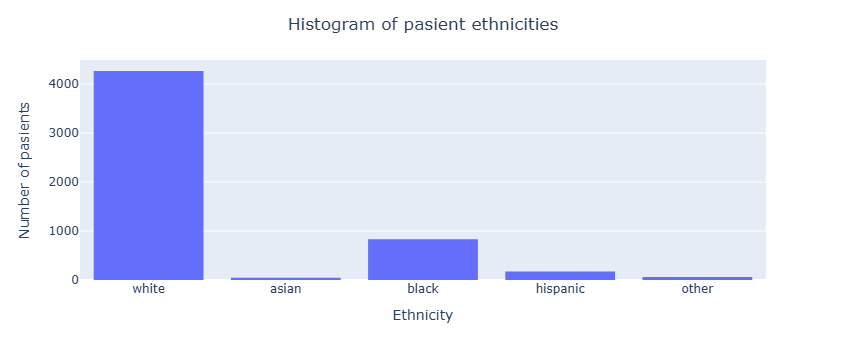

'Yey! No missing values in columns: etnisitet'

In [13]:
col = "etnisitet"
#print(train_df[col].value_counts())
#print(train_df[col].describe())

#Visualise ethnicity distibution
fig = px.histogram(train_df[col], x = col)
fig.update_layout(
    title="Histogram of pasient ethnicities",
    yaxis_title = f"Number of pasients",
    xaxis_title = f"Ethnicity",
    title_x=0.5 
)
fig.show()

# Impute etnisity col with most frequent value
etnisity_imp = SimpleImputer(strategy="most_frequent")
etnisity_imp.fit(train_df[[col]])  
   
for df in dfs:
    impute(df, [col], etnisity_imp)

missing_data(train_df[[col]])

##### Column: Education

Education stats
count    4435.000000
mean       11.802480
std         3.421883
min         0.000000
25%        10.000000
50%        12.000000
75%        14.000000
max        31.000000
Name: utdanning, dtype: float64


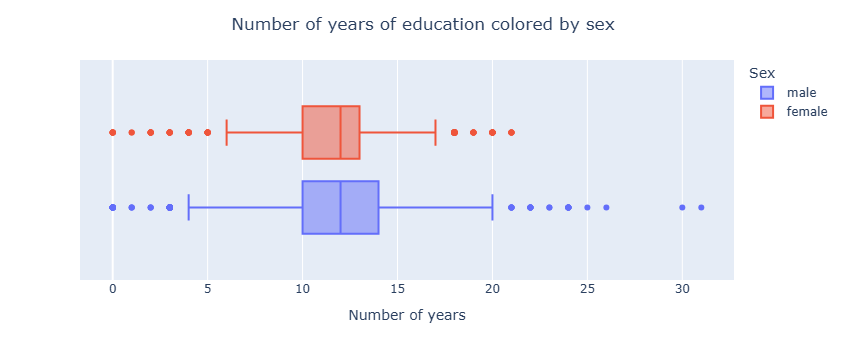

'Yey! No missing values in columns: utdanning'

In [14]:
col = "utdanning"

print("Education stats")
print(train_df[col].describe())

# Visualise education distribution by sex
fig = px.box(train_df, x = col, color = "kjønn")
fig.update_layout(
    title="Number of years of education colored by sex",
    xaxis_title = f"Number of years",
    title_x=0.5,
    legend_title_text="Sex"
)
fig.show()

etnisity_imp = SimpleImputer(strategy="median")
etnisity_imp.fit(train_df[[col]])  

for df in dfs:
    impute(df, [col], etnisity_imp)

missing_data(train_df[[col]])

##### Column: income, age

In [15]:
col = "inntekt"

print(train_df[col].value_counts())
print()

# Calculate chi2 constigency to evaluete relation between income and education
print("Educatoin and income")
crosstable = pd.crosstab(train_df['utdanning'], train_df[col])
chi2, p, dof, expected = chi2_contingency(crosstable)
print(f"Chi-square stat (chi2): {round(chi2,2)}, p-value: {p}")

# Calculate chi2 constigency to evaluete relation between income and age
print("Education and age")
crosstable = pd.crosstab(train_df['utdanning'], train_df["alder"])
chi2, p, dof, expected = chi2_contingency(crosstable)
print(f"Chi-square stat (chi2): {round(chi2,2)}, p-value: {p}")

inntekt
under $11k    1672
$11-$25k       917
$25-$50k       621
>$50k          410
Name: count, dtype: int64

Educatoin and income
Chi-square stat (chi2): 1047.04, p-value: 4.2133198336971265e-166
Education and age
Chi-square stat (chi2): 134000.82, p-value: 0.023231212541368444


In [16]:
# Chi square test show relation between variables

def encode(df):
    df['income_encoded'] = df['inntekt'].apply(lambda x: label_encoder.transform([x])[0] if pd.notnull(x) else np.nan)

def decode(df):
    df['inntekt'] = df['income_encoded'].apply( lambda x: label_encoder.inverse_transform([int(x)])[0] if pd.notnull(x) else np.nan)
    df.drop(columns=['income_encoded'], inplace=True)


# Encode categorical values in income to be able to use imputer
label_encoder = LabelEncoder()
label_encoder.fit(train_df['inntekt'].dropna().astype(str))

for df in dfs:
    encode(df)

cols = ["utdanning", "alder", "income_encoded"]
knn_imputer = KNNImputer(n_neighbors=1)
knn_imputer.fit(train_df[cols])

# Impute missing data in age and income with knn imputer
for df in dfs:
    impute(df, cols, knn_imputer)
    decode(df)

missing_data(train_df[cols[:2] + ["inntekt"]])

'Yey! No missing values in columns: utdanning, alder, inntekt'

##### Column: glucose

In [17]:
# Investigate relation between missing glucode values and diabetes
crosstab = pd.crosstab(train_df['diabetes'], train_df['glukose'].notna().astype(int), rownames=['Diabetes'], colnames=['Glucose'])
print(crosstab)

Glucose      0     1
Diabetes            
0.0       2185  2151
1.0        475   602


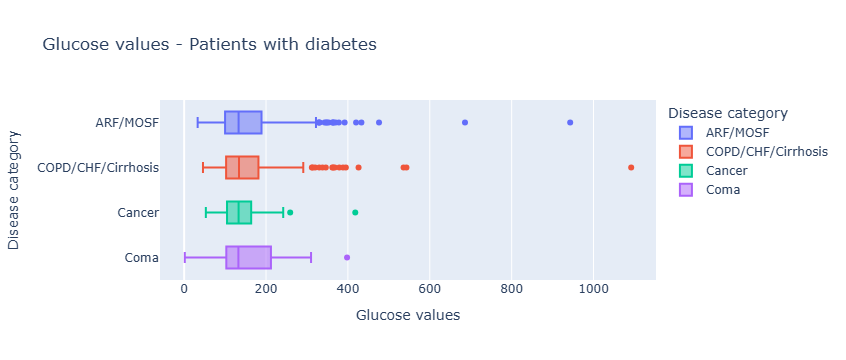

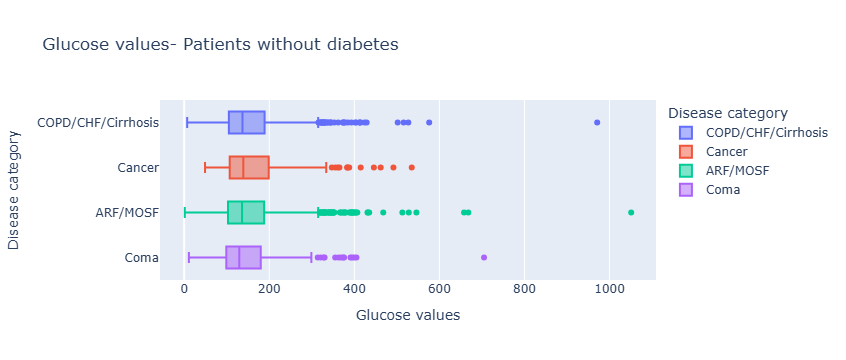

Pasients without diabetes
count     602.000000
mean      160.049169
std        95.271109
min         1.599854
25%       102.000000
50%       133.000000
75%       186.750000
max      1092.000000
Name: glukose, dtype: float64
Pasients with diabetes
count    2151.000000
mean      159.517155
std        84.631036
min         1.399902
25%       103.000000
50%       136.000000
75%       190.000000
max      1051.000000
Name: glukose, dtype: float64


In [18]:
# Seperate glukode values for diabetes and non diabetes patiens
diabetes = train_df[train_df['diabetes'] == 1]['glukose']
non_diabetes = train_df[train_df['diabetes'] == 0]['glukose']

# Visualize diabetes patiens by disease category
fig = px.box(train_df[train_df['diabetes'] == 1], x = diabetes, y ="sykdomskategori",  title="Glucose values - Patients with diabetes", color = "sykdomskategori")
fig.update_layout(xaxis_title='Glucose values',yaxis_title = "Disease category", legend_title_text="Disease category")
fig.show()
# Visualize non diabetes patiens by disease category
fig = px.box(train_df[train_df['diabetes'] == 0], x = non_diabetes, y= "sykdomskategori",title="Glucose values- Patients without diabetes", color = "sykdomskategori")
fig.update_layout(xaxis_title='Glucose values',yaxis_title = "Disease category",  legend_title_text="Disease category")
fig.show()

# Get statistical overview
print("Pasients without diabetes")
print(diabetes.describe())
print("Pasients with diabetes")
print(non_diabetes.describe())

# Retrive median
median_diabetes= diabetes.median()
median_non_diabetes = non_diabetes.median()


In [19]:
def impute_glucose(df, diabetes, non_diabetes): 
    df.loc[(df['glukose'].isnull()) & (df['diabetes'] == 0), 'glukose'] = non_diabetes
    df.loc[(df['glukose'].isnull()) & (df['diabetes'] == 1), 'glukose'] = diabetes


for df in dfs:
    impute_glucose(df, median_diabetes, median_non_diabetes)

missing_data(train_df[["glukose"]])

'Yey! No missing values in columns: glukose'

##### Column: blod ph

Blod ph values:
Disease: ARF/MOSF
Mean: 7.41
Median: 7.43

Disease: COPD/CHF/Cirrhosis
Mean: 7.41
Median: 7.42

Disease: ARF/MOSF w/Sepsis
Mean: 7.42
Median: 7.43

Disease: COPD
Mean: 7.39
Median: 7.4

Disease: Lung Cancer
Mean: 7.42
Median: 7.43

Disease: MOSF w/Malig
Mean: 7.41
Median: 7.42



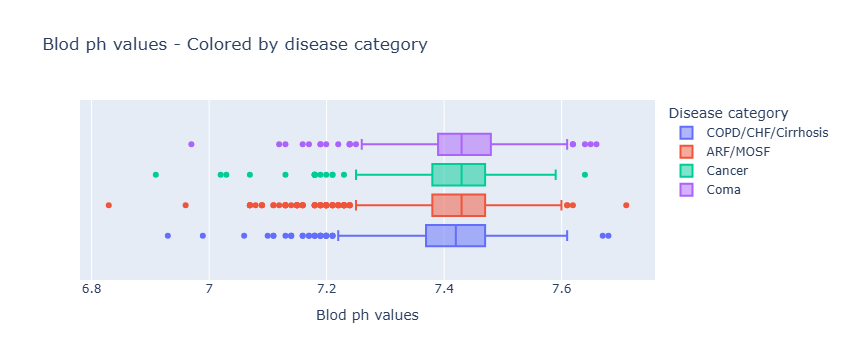

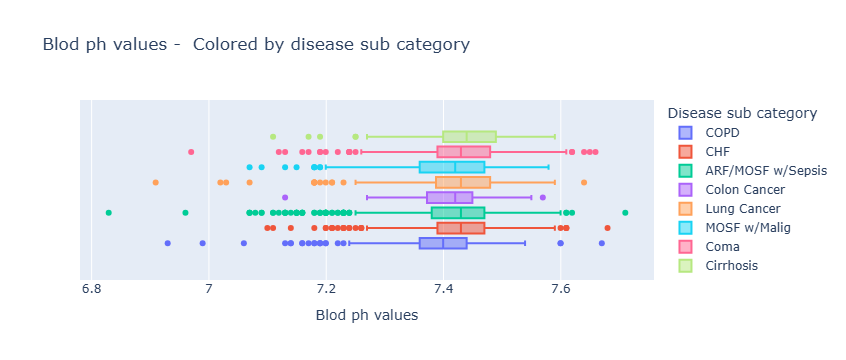

In [20]:
lung_kidney_disease = { "ARF/MOSF" :  train_df[train_df['sykdomskategori'] == "ARF/MOSF"]["blod_ph"],
                        "COPD/CHF/Cirrhosis" : train_df[train_df['sykdomskategori'] == "COPD/CHF/Cirrhosis"]["blod_ph"],
                        "ARF/MOSF w/Sepsis": train_df[train_df['sykdom_underkategori'] == "ARF/MOSF w/Sepsis"]["blod_ph"],
                        "COPD":  train_df[train_df['sykdom_underkategori'] == "COPD"]["blod_ph"],
                        "Lung Cancer" : train_df[train_df['sykdom_underkategori'] == "Lung Cancer"]["blod_ph"],
                        "MOSF w/Malig" : train_df[train_df['sykdom_underkategori'] == "MOSF w/Malig"]["blod_ph"] }

# Calculate and visualize blod ph by disease categorry
print("Blod ph values:")
for disease, values in lung_kidney_disease.items():
    print("Disease:",disease)
    print(f"Mean:",round(values.mean(),2))
    print("Median:",round(values.median(),2))
    print()

fig = px.box(train_df, x = "blod_ph", title="Blod ph values - Colored by disease category", color = "sykdomskategori")
fig.update_layout(xaxis_title='Blod ph values',  legend_title_text="Disease category")
fig.show()
fig = px.box(train_df, x = "blod_ph", title="Blod ph values -  Colored by disease sub category", color = "sykdom_underkategori")
fig.update_layout(xaxis_title="Blod ph values", legend_title_text="Disease sub category")
fig.show()

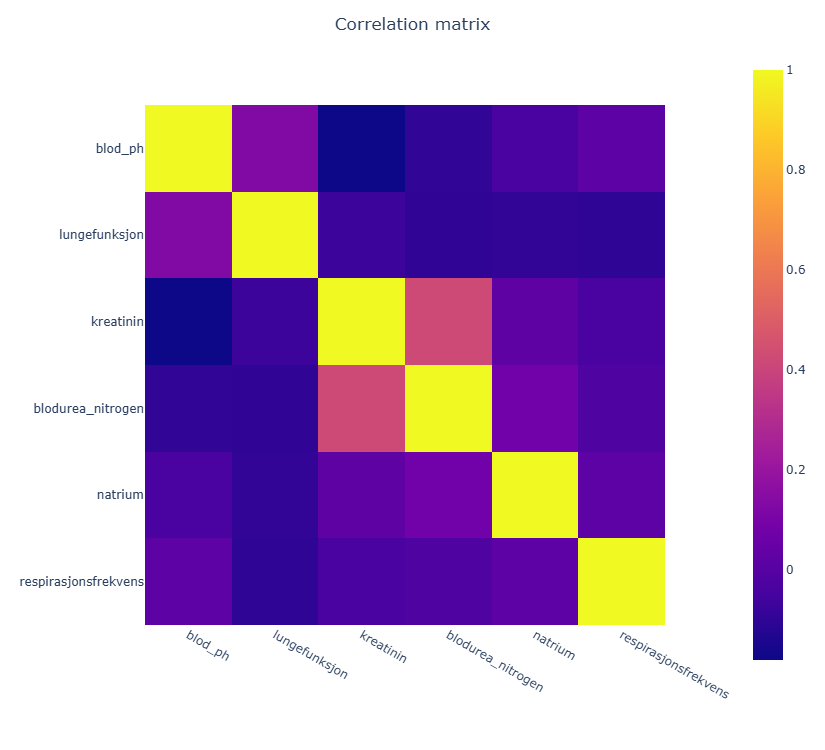

In [21]:
cols =['blod_ph', 'lungefunksjon', 'kreatinin',"blodurea_nitrogen", "natrium", "respirasjonsfrekvens"]
correlation_matrix = train_df[cols].corr()
fig = px.imshow(correlation_matrix, width = 750, height = 750)
fig.update_layout(
    title = "Correlation matrix",   
    title_x = 0.5  
)
fig.show()

In [22]:
# Function calculates rmse of column for KNN imputer with neighbors ranging 1-10
def best_knn_imputer(df,df_val, cols, col, print_all):
    registered_values = df[df[col].notnull()][cols].copy()
    X_val = df_val[df_val[col].notnull()][cols].copy()
    y_val = X_val[col]
    X_val[col] = np.nan
    
    best_rmse = 10
    best_imp = None
    best_i = None
    for i in range(1, 10):
        imp = KNNImputer(n_neighbors=i)
        imp.fit(registered_values)
      
        imputed = imp.transform(X_val)[:,cols.index(col)]
        rmse = round(mean_squared_error(y_val, imputed)**0.5, 1)
        
        if print_all:
            print(i, rmse)
            
        if rmse < best_rmse:
            best_rmse = rmse
            best_imp = imp
            best_i = i
            
    return best_rmse, best_i, best_imp

In [23]:
cols =['blod_ph', 'lungefunksjon', 'kreatinin',"blodurea_nitrogen", "natrium", "respirasjonsfrekvens"]
# Find best imputer for blod ph
rmse, i, best_imp = best_knn_imputer(train_df,val_df, cols, "blod_ph", False)

for df in dfs:
    impute(df, cols, best_imp)

missing_data(train_df[["blod_ph"]])

'Yey! No missing values in columns: blod_ph'

##### Column: adl_stedfortreder, lege_overlevelsesestimat_2mnd, lege_overlevelsesestimat_6mnd

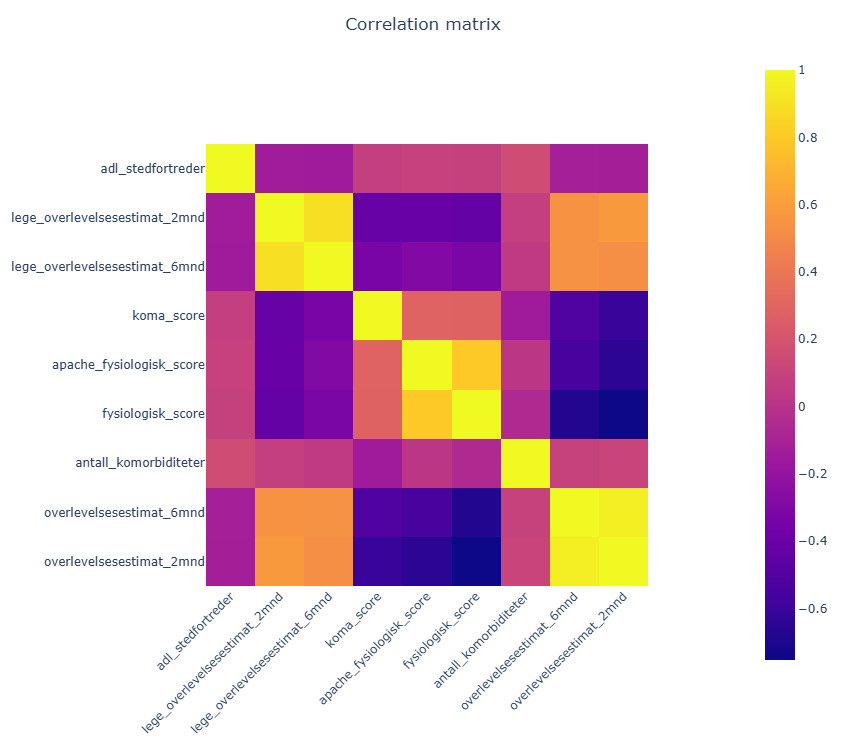

In [24]:
cols =['adl_stedfortreder','lege_overlevelsesestimat_2mnd', "lege_overlevelsesestimat_6mnd", "koma_score", "apache_fysiologisk_score","fysiologisk_score", "antall_komorbiditeter", "overlevelsesestimat_6mnd", "overlevelsesestimat_2mnd"]
# Visualise correlation of cols
correlation_matrix = train_df[cols].corr()
fig = px.imshow(correlation_matrix, width = 750, height = 750)
fig.update_layout(
    title = "Correlation matrix",
    title_x = 0.5,
    xaxis=dict(
        tickangle=-45 
    )
)
fig.show()

In [25]:
# Print best imputer for cols adl_stedfortreder, lege_overlevelsesestimat_2mnd, lege_overlevelsesestimat_6mnd
print(best_knn_imputer(train_df, val_df, cols, "adl_stedfortreder", False)) # Change to True to view rmse for all n_neighbors
print(best_knn_imputer(train_df, val_df, cols, "lege_overlevelsesestimat_2mnd", False))
print(best_knn_imputer(train_df, val_df, cols, "lege_overlevelsesestimat_6mnd", False))
best_rmse, best_n_neighbors, best_imp = best_knn_imputer(train_df, val_df, cols, "lege_overlevelsesestimat_6mnd", False)

for df in dfs:
    impute(df, cols, best_imp)

missing_data(train_df[cols[:3]])    

(2.3, 6, KNNImputer(n_neighbors=6))
(0.2, 6, KNNImputer(n_neighbors=6))
(0.3, 1, KNNImputer(n_neighbors=1))


'Yey! No missing values in columns: adl_stedfortreder, lege_overlevelsesestimat_2mnd, lege_overlevelsesestimat_6mnd'

### 1.7 Transformation of categorical variables to numerical values

In [26]:
object_columns = train_df.select_dtypes(include=["object"]).columns.tolist()

encoder = OneHotEncoder(sparse_output=False, handle_unknown='ignore')
encoder.fit(train_df[object_columns])

def transform(df):
    encoded = encoder.transform(df[object_columns])
    encoded_df = pd.DataFrame(encoded, columns=encoder.get_feature_names_out(object_columns), index=df.index)
    df.drop(columns=object_columns, inplace=True)
    for col in encoded_df.columns:
        df[col] = encoded_df[col]

for df in dfs:
    transform(df)

### 1.8 Visualization of disease sub categories and lenght of hospital stay

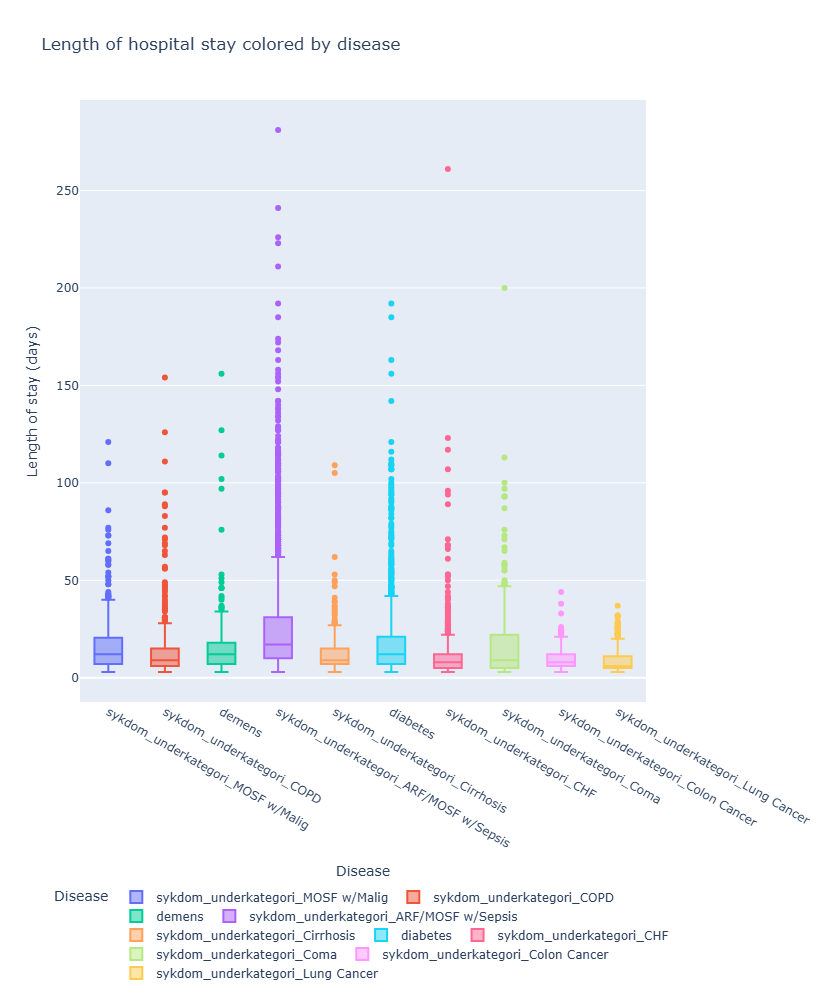

In [27]:
disease_cols={"demens", "diabetes", "sykdom_underkategori_ARF/MOSF w/Sepsis", "sykdom_underkategori_CHF", "sykdom_underkategori_COPD", "sykdom_underkategori_Cirrhosis", "sykdom_underkategori_Colon Cancer", "sykdom_underkategori_Coma", "sykdom_underkategori_Lung Cancer", "sykdom_underkategori_MOSF w/Malig"}
disease_melted=pd.melt(train_df, id_vars=["oppholdslengde"], value_vars=disease_cols, var_name="Disease", value_name="Har sykdom")
disease_melted=disease_melted[disease_melted["Har sykdom"]==True]
fig = px.box(
    disease_melted, 
    x="Disease", 
    y="oppholdslengde", 
    color="Disease", 
    title="Length of hospital stay colored by disease", 
    labels={"oppholdslengde": "Length of stay (days)"}, 
    width=1000, 
    height=1000
)

fig.update_layout(
    legend=dict(
        orientation="h",
        yanchor="top",
        y=-0.3, 
        xanchor="center",
        x=0.5
    )
)
fig.show()


### 2.0 Separation of variables before model training

In [28]:
def seperate(df):
    X = df.drop("oppholdslengde", axis=1)
    y = df["oppholdslengde"]
    return X, y

X_train, y_train = seperate(train_df)
X_val, y_val = seperate(val_df)
X_test, y_test = seperate(test_df)

### 2.1 Baseline

In [29]:
# Function visualizes relation of predicted leght of stay and actual lenght of stay
def visualize_predicted_los(y_pred, y_val, name):
    df = pd.DataFrame({'y_val': y_val, 'y_pred': y_pred})
    df_sorted = df.sort_values(by='y_val').reset_index(drop=True)
    fig = go.Figure()
    fig.add_trace(
        go.Scatter(
            x=df_sorted.index, 
            y=df_sorted['y_pred'],
            name='Predicted',
            mode='markers',
            line=dict(color='blue'), 
        )
    )
    fig.add_trace(
        go.Scatter(
            x=df_sorted.index, 
            y=df_sorted['y_val'], 
            mode='lines', 
            name='Actual',
            line=dict(color='red'), 
        )
    )
    fig.update_layout(
        title=f'Length of stay predicted by model: {name}',
        xaxis_title="Patients",
        yaxis_title="Length of stay"
    )
    fig.show()

Baseline rmse: 20.604


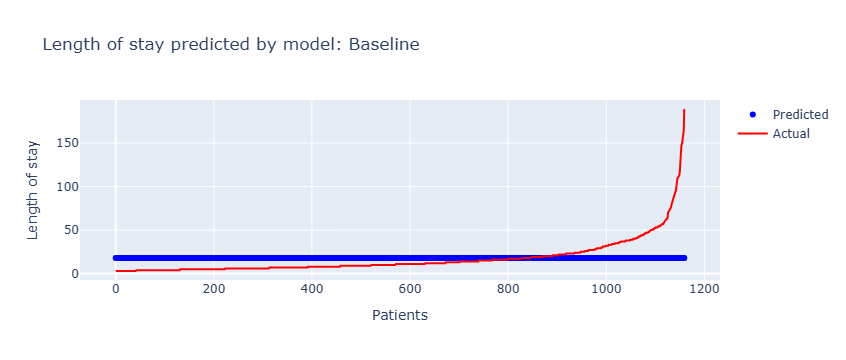

In [30]:
baseline = DummyRegressor(strategy="mean")
baseline.fit(X_train, y_train)
baseline_pred = baseline.predict(X_val)
baseline_rmse = mean_squared_error(y_val, (baseline_pred)) **0.5
print("Baseline rmse:", round(baseline_rmse, 3))
visualize_predicted_los(baseline_pred, y_val, "Baseline")

### 2.2 General modeling and visualization of model predictions

In [31]:
models = {  "Elastisk nett regresjon" :  ElasticNet(random_state = 42),
            "Ekstra skog regresjon"    : ExtraTreesRegressor(random_state = 42),
            "Beslutnings regresjon" :    DecisionTreeRegressor(random_state = 42),
            "Tilfeldig skog regresjon" : RandomForestRegressor( random_state = 42),
            "Support vektor regresjon" : SVR(),
            "Ridge" :                    Ridge(random_state = 42),
            "Gaussisk prosess" :         GaussianProcessRegressor(random_state = 42),
            "Nevrale nett" :             MLPRegressor(random_state = 42) ,
            "Lasso regresjon" :          Lasso( random_state = 42),
            "Lineær Regresjon" :         LinearRegression()
         }

In [32]:
def models_predict(models, X_train, y_train, X_val, y_val, visualize = False):
    models = models.copy()
    models = {key :  model.fit(X_train, y_train) for key, model in models.items() }
    models_pred = {key : model.predict(X_val) for key, model in models.items() }
    models_mse = {key : np.round(mean_squared_error(y_val,  pred)**0.5, decimals = 2) for key, pred in models_pred.items() }

    if visualize:
        [visualize_predicted_los(y_pred, y_val, key) for key, y_pred in models_pred.items()]
        
    return models_mse, models
    
def get_mse_df(models_mse):
    best_model = min(models_mse, key=models_mse.get)
    models_df = pd.DataFrame(models_mse.items(), columns=["Models", "RMSE"])
    models_df = models_df.sort_values(by="RMSE").reset_index(drop=True)
    return models_df, best_model

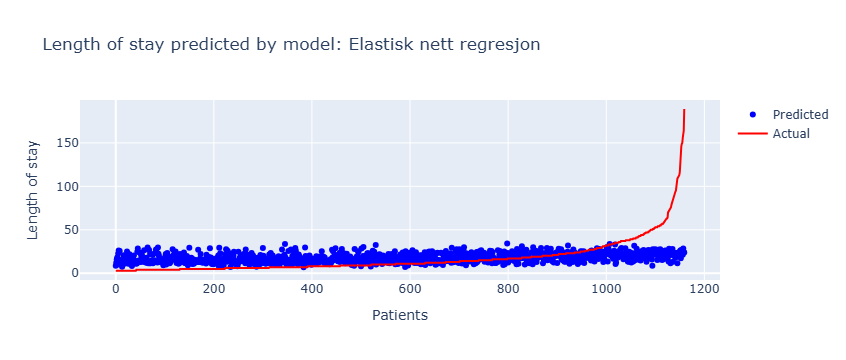

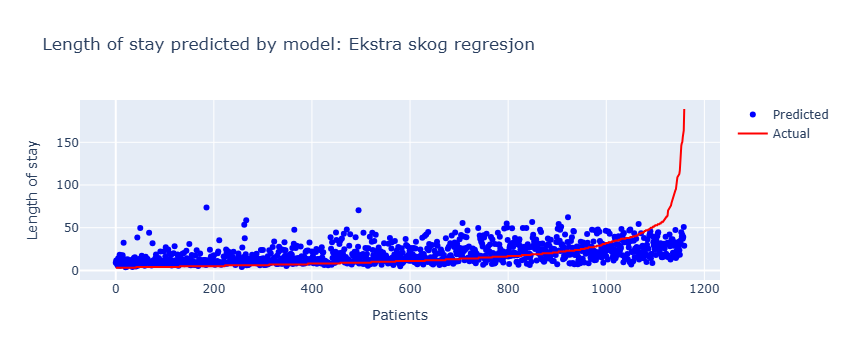

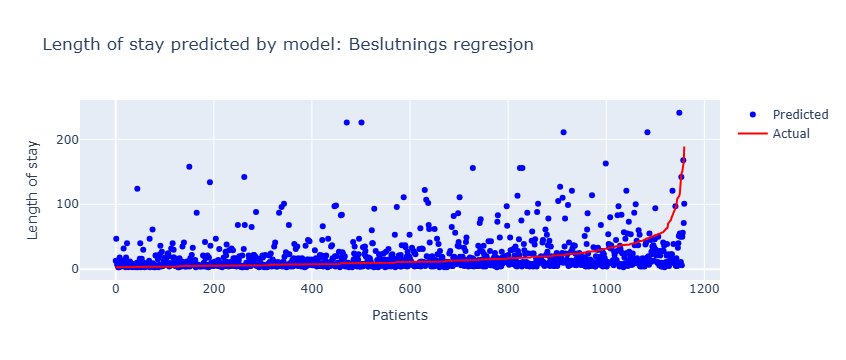

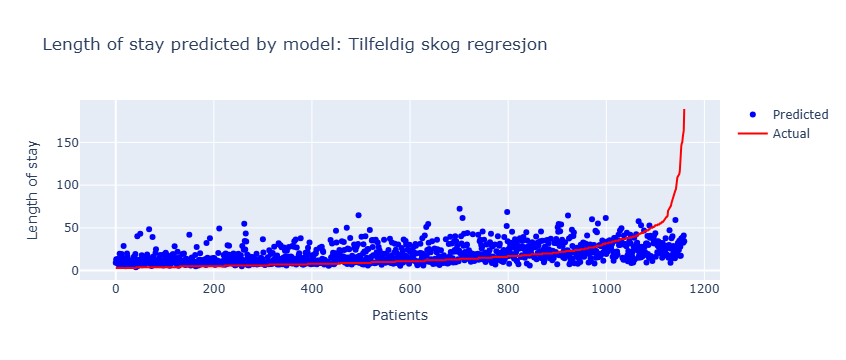

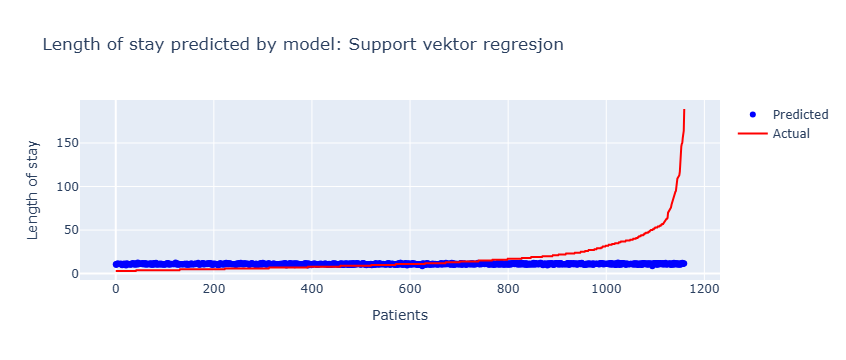

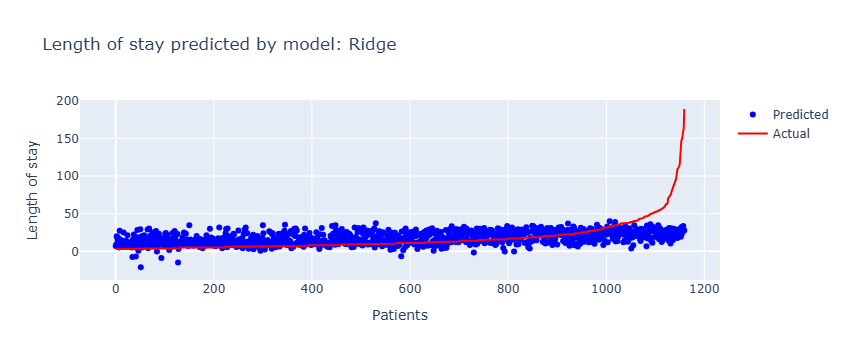

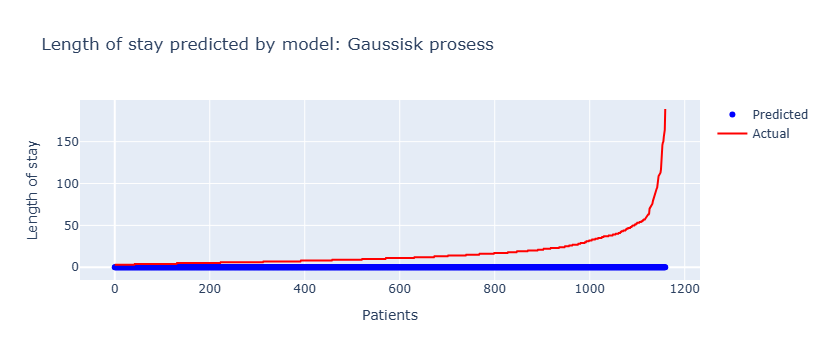

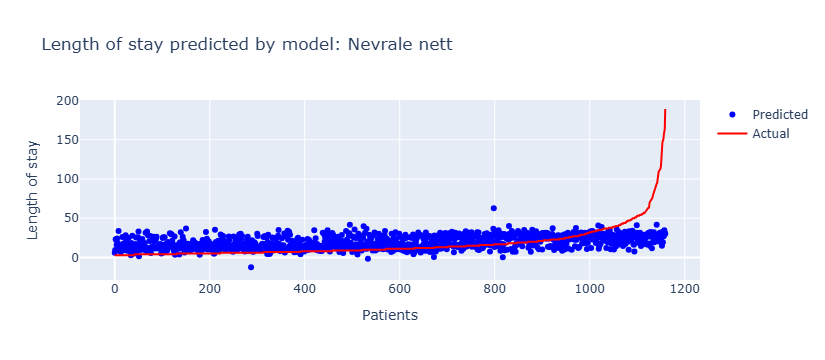

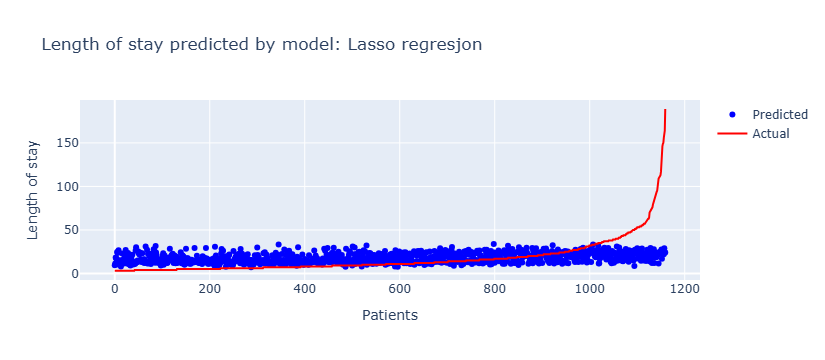

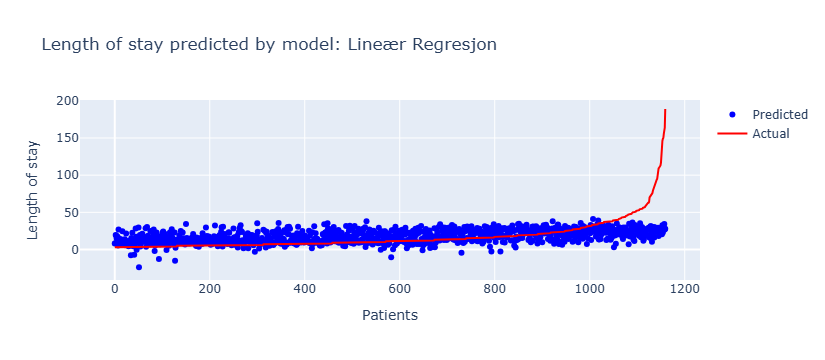

In [33]:
models_mse, trained_models = models_predict(models, X_train, y_train, X_val, y_val, True)

In [34]:
mse_df, best_model = get_mse_df(models_mse)
mse_df

,Models,RMSE
0,Ridge,19.09
1,Lineær Regresjon,19.10
2,Nevrale nett,19.46
3,Ekstra skog regresjon,19.56
4,Lasso regresjon,19.60
5,Elastisk nett regresjon,19.64
6,Tilfeldig skog regresjon,19.82
7,Support vektor regresjon,21.50
8,Gaussisk prosess,26.97
9,Beslutnings regresjon,30.18


In [35]:
models.pop("Gaussisk prosess")
models.pop("Support vektor regresjon")
models.pop("Beslutnings regresjon")

DecisionTreeRegressor(random_state=42)

### 2.2 Evaluation of Lasso, Ridge, and Polynomial Regression Models

In [36]:
def get_best_alpha(model, visualise, print_all):
    if model == "Lasso":
        models = {alpha: Lasso(alpha=alpha, random_state = 42).fit(X_train,y_train)  for alpha in np.arange(0.005, 0.2, 0.005 )}
    elif model ==  "Elastisk nett regresjon":
         models = {alpha: ElasticNet(alpha=alpha, random_state = 42).fit(X_train,y_train)  for alpha in np.arange(0.005, 0.2, 0.005 )}
    else:
        models = {alpha: Ridge(alpha=alpha, random_state = 42).fit(X_train,y_train)  for alpha in np.arange(0.05, 2, 0.05 )}
        
    rmse = { alpha : mean_squared_error(y_val, model.predict(X_val))**0.5 for alpha, model in models.items()}
    
    best_alpha = min(rmse , key = rmse.get)
    if print_all:
        print(model)
        print("Best alpha value", best_alpha)
        print("Best alpha rmse", round(rmse[best_alpha], 2))

    if visualise:
        fig = px.scatter(rmse.items(), x = rmse.keys(), y = rmse.values())
        fig.update_layout(
            xaxis_title='alpha', 
            yaxis_title='RMSE',
            title = f"Mean square error by alpha. Model: {model}")
        fig.show()


    return best_alpha, models[best_alpha]

Lasso
Best alpha value 0.01
Best alpha rmse 19.1


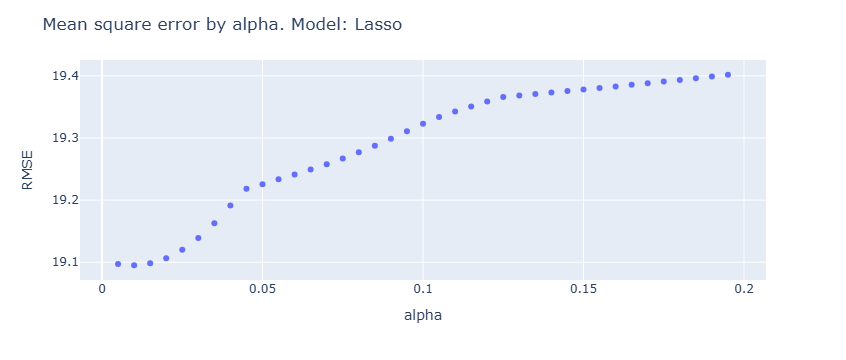

In [37]:
best_lasso_alpha, best_lasso_model = get_best_alpha("Lasso", True, True)

Ridge
Best alpha value 1.1500000000000001
Best alpha rmse 19.09


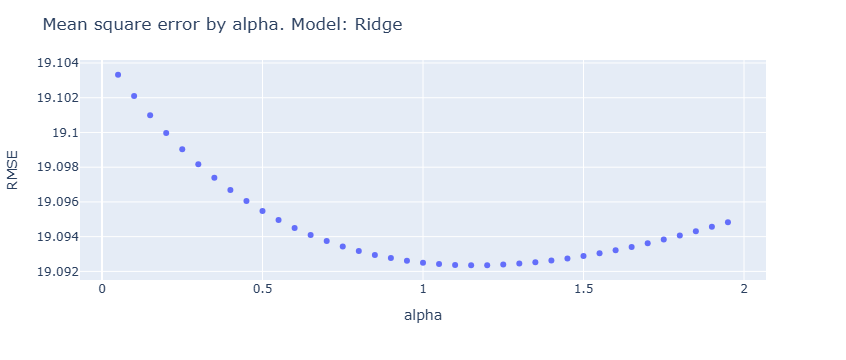

In [38]:
best_ridge_alpha, best_ridge_model= get_best_alpha("Ridge", True, True)

Elastisk nett regresjon
Best alpha value 0.005
Best alpha rmse 19.17


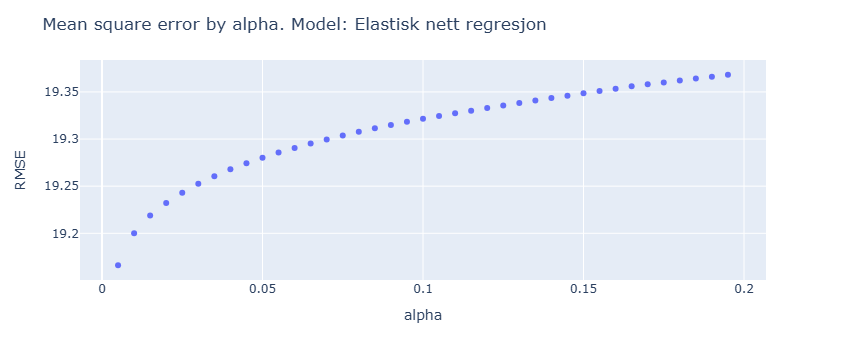

In [39]:
best_ENR_alpha, best_ENR_model= get_best_alpha("Elastisk nett regresjon", True, True)

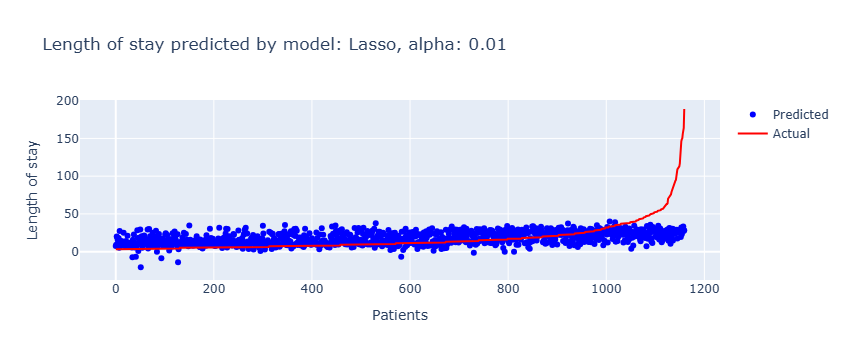

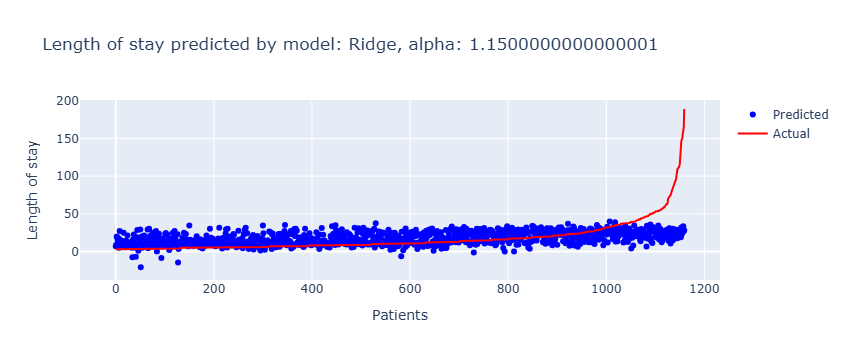

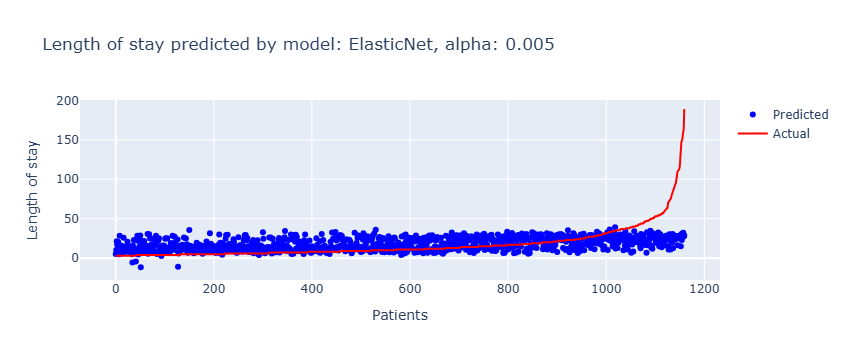

In [40]:
visualize_predicted_los(best_lasso_model.predict(X_val), y_val , f"Lasso, alpha: {best_lasso_alpha}")
visualize_predicted_los(best_ridge_model.predict(X_val), y_val ,  f"Ridge, alpha: {best_ridge_alpha}")
visualize_predicted_los(best_ENR_model.predict(X_val), y_val ,  f"ElasticNet, alpha: {best_ENR_alpha}")
models.pop("Elastisk nett regresjon")
models.pop("Ridge")
lasso_pred = best_lasso_model.predict(X_val)

### 2.4 Evaluation of polynomial degrees for optimal model performance

In [41]:
def get_best_poly_deg(print_all=False, visualise=False):
    polyreg_models = {deg: make_pipeline(PolynomialFeatures(degree=deg), LinearRegression()).fit(X_train, y_train) for deg in range(3)}
    rmse = {deg: mean_squared_error(y_val,  reg.predict(X_val))**0.5 for deg, reg in polyreg_models.items()}
    best_deg = min(rmse, key = rmse.get)
    best_model = polyreg_models[best_deg]

    if print_all:
        print(f"Beste grad av PolynomialFeatures: {best_deg}")
        print(f"RMSE for valideringsdata: {np.round(rmse[best_deg], 3)}")


In [42]:
best_poly_model = get_best_poly_deg(True, True)

Beste grad av PolynomialFeatures: 1
RMSE for valideringsdata: 19.105


### 2.5 Effects of quantile clipping on model performance

In [43]:
# Clip y - values (lenght of stay)
def get_best_persentile_clip():
    best_rmse = 20
    best_quantile = 0
    best_models_df = None
    best_p = 0
    for i in range(95,97, 1):
        q = y_train.quantile(i/100)
        cliped_models_mse, cliped_trained_models = models_predict(models, X_train, y_train.clip(upper=q), X_val, y_val)
        cliped_mse_df, cliped_best_model = get_mse_df(cliped_models_mse)
        rmse =cliped_models_mse[cliped_best_model]

        if rmse < best_rmse:
            best_rmse = rmse
            best_quantile = q
            best_models_df = cliped_mse_df
            best_p = i
            
    return best_quantile, best_models_df, cliped_trained_models, best_p

best_q , mse_df_cliped, cliped_trained_model, best_p = get_best_persentile_clip()
print("Best persentile to clip",best_p, "%")
mse_df_cliped

Best persentile to clip 96 %


,Models,RMSE
0,Ekstra skog regresjon,18.84
1,Tilfeldig skog regresjon,18.91
2,Lineær Regresjon,19.11
3,Nevrale nett,19.60
4,Lasso regresjon,19.77


In [44]:
# Clip x -values 
def clip_outliers(df, lower_quantile=0.05, upper_quantile=0.90):
    clipped_df = df.copy()
    
    for col in clipped_df.columns:
        if clipped_df[col].dtype in ['float64', 'int64']:
            lower_bound = clipped_df[col].quantile(lower_quantile)
            upper_bound = clipped_df[col].quantile(upper_quantile)
            clipped_df[col] = clipped_df[col].clip(lower=lower_bound, upper=upper_bound)
    
    return clipped_df
    
def test_diff_persentile_clip():
    best_model = None
    best_rmse = 20
    best_df = None
    for upper in range (75, 100, 5):
        for lower in range(0,5,1):
            models_mse, _ = models_predict(models, clip_outliers(X_train, lower/100, upper/100), y_train, X_val, y_val, False)
            mse_df, model = get_mse_df(models_mse)
            rmse = models_mse[model]
            print("lower", lower)
            print("upper" , upper)
            print(mse_df)
            if rmse < best_rmse:
                best_rmse = rmse
                best_model = model
                best_df = mse_df
    return best_model, best_df
    
# test_diff_persentile_clip()
X_cipped_models_mse, _ = models_predict(models, clip_outliers(X_train, 0.1, 0.95), y_train, X_val, y_val, False)
X_cliped_mse_df, _ = get_mse_df(X_cipped_models_mse)
X_cliped_mse_df

,Models,RMSE
0,Lineær Regresjon,19.20
1,Lasso regresjon,19.71
2,Ekstra skog regresjon,19.73
3,Tilfeldig skog regresjon,19.80
4,Nevrale nett,22.19


### 2.6 Effects of intervall aggregation

In [45]:
def create_bins(df):
    df = df.copy()
    # Create bins for "col" and group based on "source"
    # Column: lungfunction | Source:  https://litfl.com/pao2-fio2-ratio/
    bins = [-np.inf, 100, 200, 300, np.inf]
    labels = ["Severe", "Moderate", "Mild", "Normal"]
    df["lungefunksjon"] = pd.cut(df["lungefunksjon"], bins=bins, labels=labels, right=False)
    # Column: blood ph   | Source: data doc
    bins = [-np.inf, 7.35, 7.45, np.inf]
    labels = ["Low", "Normal", "High"]
    df["blod_ph"] = pd.cut(df["blod_ph"], bins=bins, labels=labels, right=False)
    # Column: body temperatur | Source: https://en.wikipedia.org/wiki/Human_body_temperature
    bins = [-np.inf, 35.0, 36.5, 37.5, 38.5, np.inf]
    labels = ["Hypothermia", "Normal Low", "Normal", "Fever", "Hyperthermia"]
    df["kroppstemperatur"] = pd.cut(df["kroppstemperatur"], bins=bins, labels=labels, right=False)
    # Column: white blood cells | Source: https://en.wikipedia.org/wiki/White_blood_cell
    bins = [-np.inf, 4.0, 11.0, np.inf]
    labels = ["Leukopenia", "Normal", "Leukocytosis"]
    df["hvite_blodlegemer"] = pd.cut(df["hvite_blodlegemer"], bins=bins, labels=labels, right=False)
    # Column: Serum albumin | Source: https://en.wikipedia.org/wiki/Human_serum_albumin
    bins = [-np.inf, 3.5, 5.0, np.inf]
    labels = ["Below Normal", "Normal", "Above Normal"]
    df["serumalbumin"] = pd.cut(df["serumalbumin"], bins=bins, labels=labels, right=False)
    # Column: natrium | Source: https://en.wikipedia.org/wiki/Sodium_in_biology
    bins = [-np.inf, 125, 135, 145, np.inf]
    labels = ["Severe Hyponatremia", "Hyponatremia", "Normal", "Hypernatremia"]
    df["natrium"] = pd.cut(df["natrium"], bins=bins, labels=labels, right=False)
    # Column : creatinine | Source: https://www.mountsinai.org/health-library/tests/creatinine-blood-test
    bins = [-np.inf, 0.6, 1.3, np.inf]
    labels = ["Low", "Normal", "High"]
    df["kreatinin"] = pd.cut(df["kreatinin"], bins=bins, labels=labels, right=False)
    return df

# Create function that replaces given columns by a numericaly mapped column to make data cleaning more modular
def map_column(df, map, col_name):
    df[col_name] = df[col_name].map(map)
    df[col_name] = df[col_name].astype(dtype = float)

# Define mapingping for the diferent columns
lungfunction_mapping = {"Normal": 0,"Mild": 1,"Moderate": 2,"Severe": 3}
blod_ph_mapping = {"Low" : -1, "Normal" : 0, "High": 1}
body_temp_mapping = { "Hypothermia": -2, "Normal Low": -1, "Normal": 0, "Fever": 1, "Hyperthermia": 2}
blood_cells_mapping = {"Leukopenia": -1, "Normal": 0, "Leukocytosis": 1}
serumalbumin_mapping = {"Below Normal": 1, "Normal": 2, "Above Normal": 3 }
natrium_mapping = { "Severe Hyponatremia": -2, "Hyponatremia": -1, "Normal": 0, "Hypernatremia": 1}
creatinine_mapping = {"Low" : -1, "Normal" : 0, "High": 1}

# Use function created to map differnt values into bins
def map_columns(df):
    map_column(df, lungfunction_mapping, "lungefunksjon")
    map_column(df, blod_ph_mapping, "blod_ph")
    map_column(df, body_temp_mapping, "kroppstemperatur" )
    map_column(df, blood_cells_mapping, "hvite_blodlegemer")
    map_column(df, serumalbumin_mapping, "serumalbumin")
    map_column(df, natrium_mapping, "natrium")
    map_column(df, creatinine_mapping, "kreatinin")

In [46]:
mapped_dfs = [create_bins(X_train), create_bins(X_val)]

for df in mapped_dfs:
    map_columns(df)
# Effect of mapped cols
X_mapped_train, X_mapped_val = mapped_dfs
maped_models_mse, maped_trained_model = models_predict(models, X_mapped_train, y_train, X_mapped_val, y_val)
maped_mse_df, _ = get_mse_df(maped_models_mse)
print("Maped cols")
maped_mse_df

Maped cols


,Models,RMSE
0,Lineær Regresjon,19.08
1,Nevrale nett,19.40
2,Lasso regresjon,19.62
3,Ekstra skog regresjon,19.65
4,Tilfeldig skog regresjon,19.75


In [47]:
# Effect og mapped cols and cliped y - values
maped_models_mse, _ = models_predict(models, X_mapped_train, y_train.clip(upper =best_q), X_mapped_val, y_val)
maped_mse_df, _ = get_mse_df(maped_models_mse)
print("Maped cols and clip y-values")
maped_mse_df

Maped cols and clip y-values


,Models,RMSE
0,Ekstra skog regresjon,18.87
1,Tilfeldig skog regresjon,19.00
2,Lineær Regresjon,19.12
3,Lasso regresjon,19.80
4,Nevrale nett,20.11


In [48]:
# Save best lin model for later
best_lin_model = maped_trained_model["Lineær Regresjon"]
lin_pred = best_lin_model.predict(X_mapped_val)

### 2.7 Effects of scaling X -values

In [49]:
def test_scalers(clip = False):
    for key, scaler in scalers.items():
        scaler.fit(X_train)
        if clip:
             scaled_model_score, _ = models_predict(models, scaler.transform(X_train), y_train.clip(upper= best_q), scaler.transform(X_val), y_val)
        else:
            scaled_model_score, _ = models_predict(models, scaler.transform(X_train), y_train, scaler.transform(X_val), y_val)

        scaled_mse_df, _ = get_mse_df(scaled_model_score)
        print("Scaler", key)
        print(scaled_mse_df)
scalers = {"Standard" : StandardScaler(), "MinMax" : MinMaxScaler() , "Robust" : RobustScaler()}        
test_scalers()
# test_scalers(clip = True) #Remove comment to test scalers with cliped y - values

C:\Users\gedvy\anaconda3\envs\INF161\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



Scaler Standard
                     Models   RMSE
0          Lineær Regresjon  19.12
1           Lasso regresjon  19.50
2     Ekstra skog regresjon  19.56
3              Nevrale nett  19.59
4  Tilfeldig skog regresjon  19.82


C:\Users\gedvy\anaconda3\envs\INF161\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



Scaler MinMax
                     Models   RMSE
0              Nevrale nett  18.75
1          Lineær Regresjon  19.11
2     Ekstra skog regresjon  19.56
3           Lasso regresjon  19.65
4  Tilfeldig skog regresjon  19.82
Scaler Robust
                     Models   RMSE
0              Nevrale nett  19.07
1          Lineær Regresjon  19.10
2     Ekstra skog regresjon  19.56
3           Lasso regresjon  19.65
4  Tilfeldig skog regresjon  19.82


C:\Users\gedvy\anaconda3\envs\INF161\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



### 2.8 Random forest

In [50]:
param_grids = {
    "Tilfeldig skog regresjon": {
        'n_estimators': [100, 250, 500],
        'max_depth': [10, 20, 50, None],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'bootstrap': [True, False],
        "random_state" : [42]
    },
    "Ekstra skog regresjon": {
        'n_estimators': [100, 250, 500],
        'max_depth': [10, 20, 50, None],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'bootstrap': [True, False],
        "random_state" : [42]
    },
    "Nevrale nett": {
        'hidden_layer_sizes': [(50,), (100,), (100, 50)],
        'activation': ['relu', 'tanh'],
        'solver': ['adam', 'sgd'],
        'learning_rate': ['constant', 'adaptive'],
        'max_iter': [200, 500],
        "random_state" : [42]
    }
}

# Function does gridsearch on given model
def grid_search_model(model_name, X_train, y_train, clip=False, upper_q=None, scale= False):
    model = models.get(model_name)
    param_grid = param_grids.get(model_name)
    
    grid_search = GridSearchCV(model, param_grid, cv=5, n_jobs=-1)
    
    if clip and upper_q:
        y_train = y_train.clip(upper=upper_q)
        
    if scale:
        grid_search.fit(best_scaler.transform(X_train), y_train)
    else:
        grid_search.fit(X_train, y_train)

    if model_name == "Nevrale nett":
        print(f"Best hyperparameters for {model_name} (scale={scale}): ", grid_search.best_params_)
    else:
        print(f"Best hyperparameters for {model_name} (clip={clip}): ", grid_search.best_params_)

    return grid_search.best_estimator_

# Returns df of features sorted by importance
def get_feature_importance(model, X, y=None):

    feature_names = X.columns
    
    if hasattr(model, "feature_importances_"):
        importances = model.feature_importances_
    

    elif hasattr(model, "coef_"):
        importances = np.abs(model.coef_)
    
    elif y is not None:
        perm_importance = permutation_importance(model, X, y, n_repeats=10, random_state=42)
        importances = perm_importance.importances_mean
    
    feature_importance_df = pd.DataFrame({
        "Feature": feature_names,
        "Importance": importances
    }).sort_values(by="Importance", ascending=False).reset_index(drop=True)
    
    return feature_importance_df


# Trains model with diffent number of important featues (RFECV could be used here instead)
def test_features(best_model, importance_df, X_train = X_train, X_val = X_val, clip = False, scale = False, step = 5, stop = 57):
    results_df = pd.DataFrame(columns=["Number of columns", "RMSE"])
    
    for top_n in range(10,stop, step):
        model = best_model
        top_features = importance_df['Feature'].head(top_n).tolist()
        X_train_top = X_train[top_features]
        X_val_top = X_val[top_features]   
        
        if scale:
            scaler = MinMaxScaler().fit(X_train_top)
            X_train_top = scaler.transform(X_train_top)
            X_val_top = scaler.transform(X_val_top)
            
        if clip:
            model.fit(X_train_top, y_train.clip(upper = best_q))  
        else:
            model.fit(X_train_top, y_train) 

        y_pred = model.predict(X_val_top)
        rmse = round(mean_squared_error(y_val, y_pred)**0.5, 2)
        results_df.loc[len(results_df.index)] = [top_n, rmse]
        
    if scale:
            scaler = MinMaxScaler().fit(X_train)
            X_train = scaler.transform(X_train)
            X_val = scaler.transform(X_val)

    if clip:
        best_model.fit(X_train, y_train.clip(upper = best_q))  
    else:
        best_model.fit(X_train, y_train) 
    y_pred = best_model.predict(X_val)
    rmse = round(mean_squared_error(y_val, y_pred)**0.5, 2)
    results_df.loc[len(results_df.index)] = ["All", rmse]
    return results_df

In [51]:
# Remove comment to do grid search, be aware this takes time
# best_rf = grid_search_model("Tilfeldig skog regresjon", X_train, y_train)
# best_cliped_rf = grid_search_model("Tilfeldig skog regresjon", X_train, y_train, clip = True, upper_q = best_q)
# rf_models = {"Tilfeldig skog regresjon": best_rf, "Tilfeldig skog regresjon cliped" : best_cliped_rf}
# for name,rf_model in rf_models.items():
#     print(name)
#     y_pred = rf_model.predict(X_val)
#     rmse = mean_squared_error(y_val, y_pred)** 0.5
#     print(f"RMSE: {round(rmse,2)}")


In [52]:
rf_best_params = {
        'n_estimators': 250,
        'max_depth': 20,
        "max_features" : "log2",
        'min_samples_split': 2,
        'min_samples_leaf': 4,
        'bootstrap': False,
        "random_state" : 42
}
rf_best_model = RandomForestRegressor(**rf_best_params).fit(X_train, y_train.clip(upper = best_q))
rf_feature_importance = get_feature_importance(rf_best_model, X_train)
rf_feature_importance

,Feature,Importance
0,fysiologisk_score,0.061250
1,overlevelsesestimat_2mnd,0.057972
2,overlevelsesestimat_6mnd,0.054540
3,apache_fysiologisk_score,0.052515
4,alder,0.043506
5,sykdom_underkategori_ARF/MOSF w/Sepsis,0.040861
6,lege_overlevelsesestimat_2mnd,0.040199
7,sykdomskategori_ARF/MOSF,0.040143
8,lege_overlevelsesestimat_6mnd,0.036154
9,sykdomskategori_id_A1s,0.032328


In [53]:
test_features(RandomForestRegressor(**rf_best_params), rf_feature_importance, clip = True)

,Number of columns,RMSE
0,10.0,19.16
1,15.0,18.94
2,20.0,18.90
3,25.0,18.92
4,30.0,18.83
5,35.0,18.80
6,40.0,18.80
7,45.0,18.81
8,50.0,18.80
9,55.0,18.77


### 2.9 Ekstra skog

In [54]:
# Remove comment to do grid search, be aware this takes time
# best_ef = grid_search_model("Ekstra skog regresjon", X_train, y_train)
# best_cliped_ef = grid_search_model("Ekstra skog regresjon", X_train, y_train, clip = True, upper_q = best_q)
# ef_models = {"Ekstra skog regresjon" : best_ef, "Ekstra skog regresjon cliped" : best_cliped_ef}
# for name,ef_model in ef_models.items():
#     print(name)
#     y_pred = ef_model.predict(X_val)
#     rmse = mean_squared_error(y_val, y_pred)** 0.5
#     print(f"RMSE: {round(rmse,2)}")

In [55]:
ef_best_params = {
        'n_estimators': 500,
        'max_depth': 20,
        'min_samples_split': 10,
        'min_samples_leaf': 2,
        'max_features': 'sqrt',
        'bootstrap': False,
        "random_state" : 42
}
ef_best_model = ExtraTreesRegressor(**ef_best_params).fit(X_train, y_train)
ef_pred = ef_best_model.predict(X_val)
ef_feature_importance = get_feature_importance(ef_best_model, X_train)
ef_feature_importance

,Feature,Importance
0,sykdom_underkategori_ARF/MOSF w/Sepsis,0.057014
1,sykdomskategori_ARF/MOSF,0.047296
2,sykdomskategori_id_A1s,0.044575
3,overlevelsesestimat_2mnd,0.042372
4,lege_overlevelsesestimat_2mnd,0.041902
5,overlevelsesestimat_6mnd,0.039805
6,lege_overlevelsesestimat_6mnd,0.037334
7,fysiologisk_score,0.033706
8,apache_fysiologisk_score,0.033213
9,koma_score,0.027808


In [56]:
test_features(ExtraTreesRegressor(**ef_best_params), ef_feature_importance)

,Number of columns,RMSE
0,10.0,19.06
1,15.0,18.95
2,20.0,18.85
3,25.0,18.87
4,30.0,18.82
5,35.0,18.75
6,40.0,18.77
7,45.0,18.76
8,50.0,18.73
9,55.0,18.76


### 2.10 Nevrale nett

In [57]:
# best_nn = grid_search_model("Nevrale nett", X_train, y_train)
# best_scaled_nn = grid_search_model("Nevrale nett", X_train, y_train, scale = True)
# print("Nevrale nett")
# y_pred = best_nn.predict(X_val)
# rmse = mean_squared_error(y_val, y_pred)** 0.5
# print(f"RMSE: {round(rmse,2)}")
# print("Nevrale nett scaled")
# y_pred = best_scaled_nn.predict(best_scaler.transform(X_val))
# rmse = mean_squared_error(y_val, y_pred)** 0.5
# print(f"RMSE: {round(rmse,2)}")

In [58]:
nn_best_params = {
        'hidden_layer_sizes': (50,),
        'activation': 'tanh',
        'solver': 'adam',
        'learning_rate': 'constant',
        'max_iter': 200,
        "random_state" : 42
}
best_scaler = MinMaxScaler().fit(X_train)
X_train_scaled = pd.DataFrame(best_scaler.transform(X_train), columns=X_train.columns)  
X_val_scaled = pd.DataFrame(best_scaler.transform(X_val), columns=X_val.columns) 
best_scaled_nn = MLPRegressor(**nn_best_params).fit(X_train_scaled, y_train)
nn_pred = best_scaled_nn.predict(X_val_scaled)
nn_feature_importance = get_feature_importance(best_scaled_nn, X_train_scaled, y_train)
nn_feature_importance

C:\Users\gedvy\anaconda3\envs\INF161\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



,Feature,Importance
0,lege_overlevelsesestimat_6mnd,0.028519
1,lege_overlevelsesestimat_2mnd,0.027893
2,overlevelsesestimat_6mnd,0.021964
3,koma_score,0.020434
4,apache_fysiologisk_score,0.017207
5,overlevelsesestimat_2mnd,0.013810
6,alder,0.013575
7,sykdom_underkategori_ARF/MOSF w/Sepsis,0.011845
8,sykdom_underkategori_Lung Cancer,0.007217
9,sykdom_underkategori_MOSF w/Malig,0.006815


In [59]:
nn_rmse = test_features( MLPRegressor(**nn_best_params), nn_feature_importance, scale = True)
nn_rmse

C:\Users\gedvy\anaconda3\envs\INF161\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\gedvy\anaconda3\envs\INF161\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\gedvy\anaconda3\envs\INF161\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\gedvy\anaconda3\envs\INF161\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\gedvy\anaconda3\envs\INF161\Lib\site-packages\sklearn\neural_network\_multi

,Number of columns,RMSE
0,10.0,18.76
1,15.0,18.75
2,20.0,18.63
3,25.0,18.66
4,30.0,18.62
5,35.0,18.67
6,40.0,18.59
7,45.0,18.59
8,50.0,18.57
9,55.0,18.58


### 3.0 Selecting a model

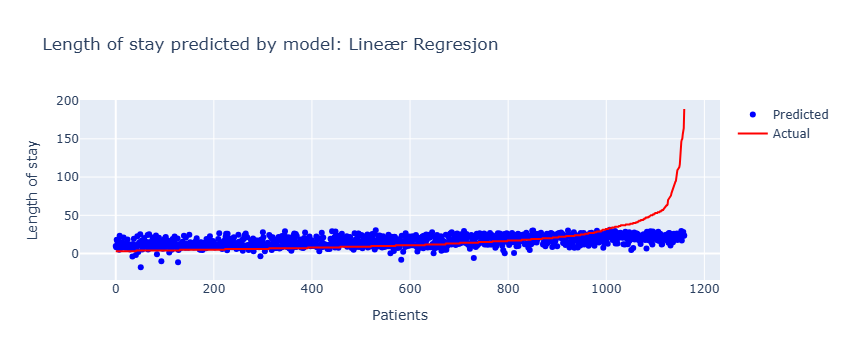

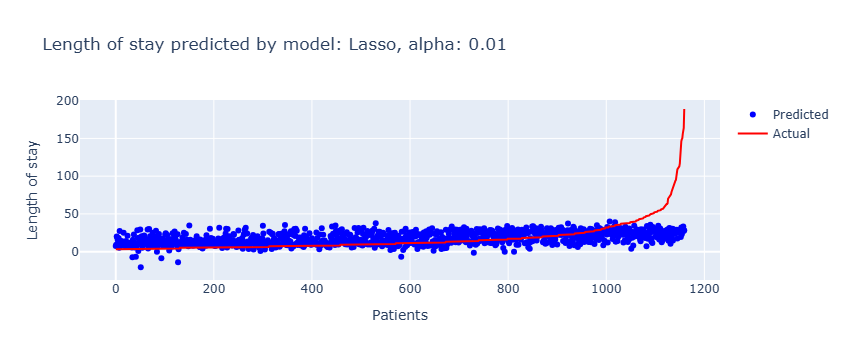

In [60]:
visualize_predicted_los(lin_pred, y_val, "Lineær Regresjon")
visualize_predicted_los(lasso_pred, y_val , f"Lasso, alpha: {best_lasso_alpha}")

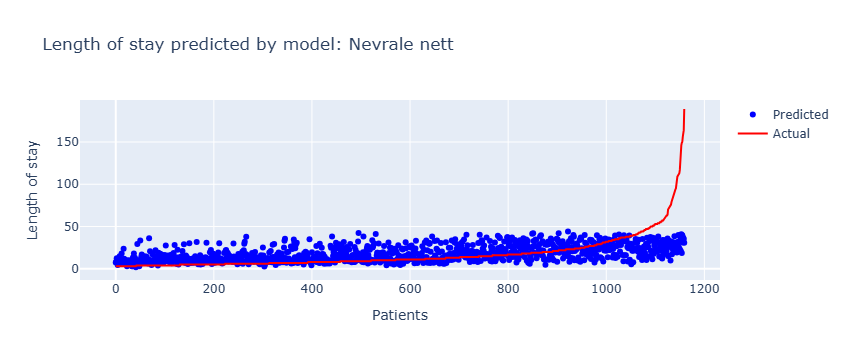

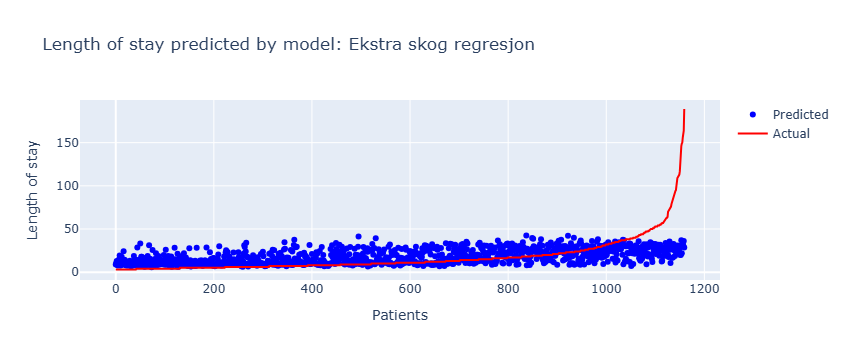

In [61]:
visualize_predicted_los(nn_pred, y_val, "Nevrale nett")
visualize_predicted_los(ef_pred, y_val, "Ekstra skog regresjon")

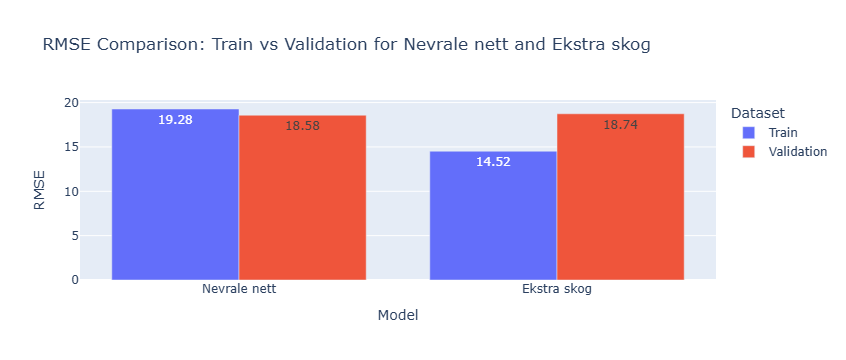

In [62]:
def plot_rmse_comparison(train_preds_nn, val_preds_nn, train_preds_ef, val_preds_ef):
    # Calculate RMSE for both models
    rmse_values = {
        'Model': ['Nevrale nett', 'Nevrale nett', 'Ekstra skog', 'Ekstra skog'],
        'Dataset': ['Train', 'Validation', 'Train', 'Validation'],
        'RMSE': [
            round(mean_squared_error(y_train, train_preds_nn)**0.5, 2),
            round(mean_squared_error(y_val, val_preds_nn)**0.5, 2),
            round(mean_squared_error(y_train, train_preds_ef)**0.5, 2),
            round(mean_squared_error(y_val, val_preds_ef)**0.5, 2)
        ]
    }
    # Create DataFrame for plotting
    rmse_df = pd.DataFrame(rmse_values)

    # Plot the RMSE comparison
    fig = px.bar(rmse_df, x='Model', y='RMSE', color='Dataset',
                 barmode='group', title="RMSE Comparison: Train vs Validation for Nevrale nett and Ekstra skog",
                 text='RMSE')
    fig.update_layout(yaxis_title='RMSE', xaxis_title='Model')
    fig.show()

# Compare models, to investigate overfitting/underfitting
X_train_scaled = pd.DataFrame(best_scaler.transform(X_train), columns=X_train.columns) 
nn_pred_train = best_scaled_nn.predict(X_train_scaled)
ef_pred_train = ef_best_model.predict(X_train)

plot_rmse_comparison(nn_pred_train, nn_pred, ef_pred_train, ef_pred)

In [63]:
# Investigate effect of reducing number of variables
reduction_var_nn = test_features( MLPRegressor(**nn_best_params), nn_feature_importance, scale = True, step = 1, stop = 25)
reduction_var_ef = test_features( ExtraTreesRegressor(**ef_best_params), ef_feature_importance, scale = True, step = 1, stop = 25)
merged_reduction_var = pd.merge(reduction_var_ef, reduction_var_nn, on='Number of columns')
merged_reduction_var = merged_reduction_var.rename(columns={
    'RMSE_x': 'RMSE Ekstra skog',
    'RMSE_y': 'RMSE Nevrale nett'
})
merged_reduction_var

C:\Users\gedvy\anaconda3\envs\INF161\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\gedvy\anaconda3\envs\INF161\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\gedvy\anaconda3\envs\INF161\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\gedvy\anaconda3\envs\INF161\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\gedvy\anaconda3\envs\INF161\Lib\site-packages\sklearn\neural_network\_multi

,Number of columns,RMSE Ekstra skog,RMSE Nevrale nett
0,10.0,19.06,18.76
1,11.0,19.02,18.76
2,12.0,18.95,18.76
3,13.0,18.94,18.78
4,14.0,18.94,18.76
5,15.0,18.95,18.75
6,16.0,18.94,18.67
7,17.0,18.95,18.66
8,18.0,18.87,18.65
9,19.0,18.90,18.65


### 3.1 Testing imputation strategies

In [64]:
imputation_strategies = {
    "mean_imputer": SimpleImputer(strategy='mean'),
    "knn_imputer 5": KNNImputer(n_neighbors=5),
    "knn_imputer 10": KNNImputer(n_neighbors=10),
    "knn_imputer 50": KNNImputer(n_neighbors=50),
    "knn_imputer 150": KNNImputer(n_neighbors=150),
    "knn_imputer 100": KNNImputer(n_neighbors=100),
    "median_imputer": SimpleImputer(strategy='median'),
    "most_frequent_imputer": SimpleImputer(strategy='most_frequent')
}

train_copy, val_copy, test_copy = dfs_copy
# Check no cols are imputed
print(missing_data(train_copy))

X_train_copy, _ = seperate(train_copy)
X_val_copy, _ = seperate(val_copy)
X_test_copy, _ = seperate(test_copy)

alder                             0.092 %
utdanning                        18.068 %
inntekt                          33.124 %
etnisitet                         0.573 %
blod_ph                          25.014 %
glukose                          49.141 %
adl_stedfortreder                31.665 %
lege_overlevelsesestimat_2mnd    18.178 %
lege_overlevelsesestimat_6mnd    17.957 %
dtype: object


In [65]:
# Retrieve numerical and categorical cols
num_columns = X_train_copy.select_dtypes(include=["number"]).columns.tolist()
cat_columns = X_train_copy.select_dtypes(include=["object"]).columns.tolist()
# Impute categorical cols with most frequent
cat_imputer = SimpleImputer(strategy="most_frequent")
X_train_copy[cat_columns] = cat_imputer.fit_transform(X_train_copy[cat_columns])
X_val_copy[cat_columns] = cat_imputer.transform(X_val_copy[cat_columns])
X_test_copy[cat_columns] = cat_imputer.transform(X_test_copy[cat_columns])
# Encode
encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)
X_train_encoded = pd.DataFrame(encoder.fit_transform(X_train_copy[cat_columns]), columns=encoder.get_feature_names_out(cat_columns), index=X_train_copy.index)
X_val_encoded = pd.DataFrame(encoder.transform(X_val_copy[cat_columns]), columns=encoder.get_feature_names_out(cat_columns), index=X_val_copy.index)
X_test_encoded = pd.DataFrame(encoder.transform(X_test_copy[cat_columns]), columns=encoder.get_feature_names_out(cat_columns), index=X_test_copy.index)

X_train_copy = X_train_copy.drop(columns=cat_columns).join(X_train_encoded)
X_val_copy = X_val_copy.drop(columns=cat_columns).join(X_val_encoded)
X_test_copy = X_test_copy.drop(columns=cat_columns).join(X_test_encoded)

In [66]:
# Compare RMSE of different imputation strategies
results = []
for name, imputer in imputation_strategies.items():

    X_train_imputed = X_train_copy.copy()
    X_val_imputed = X_val_copy.copy()
    
    X_train_imputed[num_columns] = imputer.fit_transform(X_train_copy[num_columns])
    X_val_imputed[num_columns] = imputer.transform(X_val_copy[num_columns])
    

    scaler = MinMaxScaler().fit(X_train_imputed)
    X_train_scaled = pd.DataFrame(scaler.transform(X_train_imputed), columns=X_train_imputed.columns, index=X_train_imputed.index)
    X_val_scaled = pd.DataFrame(scaler.transform(X_val_imputed), columns=X_val_imputed.columns, index=X_val_imputed.index)
    
    model = MLPRegressor(**nn_best_params)
    model.fit(X_train_scaled, y_train)
    
    y_pred = model.predict(X_val_scaled)
    rmse = round(mean_squared_error(y_val, y_pred)**0.5, 2)
    
    results.append({"Imputation Strategy": name, "RMSE": rmse})

results_df = pd.DataFrame(results)
results_df

C:\Users\gedvy\anaconda3\envs\INF161\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\gedvy\anaconda3\envs\INF161\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\gedvy\anaconda3\envs\INF161\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\gedvy\anaconda3\envs\INF161\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\gedvy\anaconda3\envs\INF161\Lib\site-packages\sklearn\neural_network\_multi

,Imputation Strategy,RMSE
0,mean_imputer,18.58
1,knn_imputer 5,18.57
2,knn_imputer 10,18.55
3,knn_imputer 50,18.55
4,knn_imputer 150,18.55
5,knn_imputer 100,18.54
6,median_imputer,18.64
7,most_frequent_imputer,18.67


In [67]:
# Save best imputer and impute dfs
best_num_imputer = KNNImputer(n_neighbors=100).fit(X_train_copy[num_columns])
X_train_copy[num_columns] = best_num_imputer.transform(X_train_copy[num_columns])
X_val_copy[num_columns] = best_num_imputer.transform(X_val_copy[num_columns])
X_test_copy[num_columns] = best_num_imputer.transform(X_test_copy[num_columns])

### 3.2 Effect of feature enginering

In [68]:
def merge_and_scale_fysiologisk(df, scaler=None):
    df['merged_score'] = df[['fysiologisk_score', 'apache_fysiologisk_score']].mean(axis=1)
    df = df.drop(columns=['fysiologisk_score', 'apache_fysiologisk_score'], errors='ignore')
    return df

def merge_and_scale_overlevelsesestimat(df):
    df['merged_overlevelsesestimat_6mnd'] = df[['overlevelsesestimat_6mnd', 'lege_overlevelsesestimat_6mnd']].mean(axis=1)
    df = df.drop(columns=['overlevelsesestimat_6mnd', 'lege_overlevelsesestimat_6mnd'], errors='ignore')
    return df

def drop_redundant_cols(df):
    df = df.drop(columns=["kjønn_male", "etnisitet_other"], errors='ignore')
    return df

def drop_sykdomskategori_columns(df):
    columns_to_drop = df.filter(regex="^sykdomskategori_id").columns
    return df.drop(columns=columns_to_drop, errors='ignore')


def evaluate_model(X_train, y_train, X_val, y_val):
    scaler = MinMaxScaler().fit(X_train)
    X_train = scaler.transform(X_train)
    X_val = scaler.transform(X_val)
    model = MLPRegressor(**nn_best_params).fit(X_train, y_train)
    y_pred = model.predict(X_val)
    rmse = round(mean_squared_error(y_val, y_pred)**0.5, 2)
    return rmse

results = []

X_train_base = X_train_copy.copy()
X_val_base = X_val_copy.copy()

# Scenario 1: Original data
results.append(("Original data", evaluate_model(X_train_base, y_train, X_val_base, y_val)))

# Scenario 2: Merge only psysiological scores
X_train_fysiologisk = merge_and_scale_fysiologisk(X_train_base.copy())
X_val_fysiologisk= merge_and_scale_fysiologisk(X_val_base.copy())
results.append(("Merge physiological scores", evaluate_model(X_train_fysiologisk, y_train, X_val_fysiologisk, y_val)))

# Scenario 3: Merge survival estimate scores
X_train_overlevelsesestimat = merge_and_scale_overlevelsesestimat(X_train_base.copy())
X_val_overlevelsesestimat = merge_and_scale_overlevelsesestimat(X_val_base.copy())
results.append(("Merge survival estimate scores", evaluate_model(X_train_overlevelsesestimat, y_train, X_val_overlevelsesestimat, y_val)))

# Scenario 4: Drop redundant cols
X_train_dropped = drop_redundant_cols(X_train_base.copy())
X_val_dropped = drop_redundant_cols(X_val_base.copy())
results.append(("Drop redundant cols", evaluate_model(X_train_dropped, y_train, X_val_dropped, y_val)))

# Scenario 5: Data with merged physiological scores and survival estimate score
X_train_both= merge_and_scale_fysiologisk(X_train_base.copy())
X_train_both= merge_and_scale_overlevelsesestimat(X_train_both)
X_val_both = merge_and_scale_fysiologisk(X_val_base.copy())
X_val_both = merge_and_scale_overlevelsesestimat(X_val_both)
results.append(("Merge both scores", evaluate_model(X_train_both, y_train, X_val_both, y_val)))

# Scenario 6: Merge both scores and drop redundant cols
X_train_merged_dropped = drop_redundant_cols(X_train_both.copy())
X_val_merged_dropped = drop_redundant_cols(X_val_both.copy())
results.append(("Merge both scores and drop redundant cols", evaluate_model(X_train_merged_dropped, y_train, X_val_merged_dropped, y_val)))

# Scenario 7: Drop disease category id
X_train_sykdomskategori_dropped = drop_sykdomskategori_columns(X_train_base.copy())
X_val_sykdomskategori_dropped = drop_sykdomskategori_columns(X_val_base.copy())
results.append(("Drop disease category id", evaluate_model(X_train_sykdomskategori_dropped, y_train, X_val_sykdomskategori_dropped, y_val)))

# Scenario 8: Drop redundant and disease category id
X_train_sykdomskategori_redundant_dropped = drop_sykdomskategori_columns(X_train_base.copy())
X_train_sykdomskategori_redundant_dropped = drop_redundant_cols(X_train_sykdomskategori_redundant_dropped)
X_val_sykdomskategori_redundant_dropped = drop_sykdomskategori_columns(X_val_base.copy())
X_val_sykdomskategori_redundant_dropped = drop_redundant_cols(X_val_sykdomskategori_redundant_dropped)

results.append(("Drop redundant and disease category id", 
                evaluate_model(X_train_sykdomskategori_redundant_dropped, y_train, X_val_sykdomskategori_redundant_dropped, y_val)))

results_df = pd.DataFrame(results, columns=["Scenario", "RMSE"])
results_df

C:\Users\gedvy\anaconda3\envs\INF161\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\gedvy\anaconda3\envs\INF161\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\gedvy\anaconda3\envs\INF161\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\gedvy\anaconda3\envs\INF161\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\gedvy\anaconda3\envs\INF161\Lib\site-packages\sklearn\neural_network\_multi

,Scenario,RMSE
0,Original data,18.54
1,Merge physiological scores,18.56
2,Merge survival estimate scores,18.57
3,Drop redundant cols,18.54
4,Merge both scores,18.59
5,Merge both scores and drop redundant cols,18.59
6,Drop disease category id,18.54
7,Drop redundant and disease category id,18.52


In [69]:
# Make final dfs and scalers
final_X_train = drop_redundant_cols(drop_sykdomskategori_columns(X_train_copy))
final_X_val = drop_redundant_cols(drop_sykdomskategori_columns(X_val_copy))
final_X_test = drop_redundant_cols(drop_sykdomskategori_columns(X_test_copy))

final_scaler = MinMaxScaler().fit(final_X_train)
final_X_train_scaled = pd.DataFrame(final_scaler.transform(final_X_train), columns=final_X_train.columns)
final_X_val_scaled = pd.DataFrame(final_scaler.transform(final_X_val), columns=final_X_val.columns)
final_X_test_scaled = pd.DataFrame(final_scaler.transform(final_X_test), columns=final_X_test.columns)

# Reevaluate feature importance
final_scaled_nn = MLPRegressor(**nn_best_params).fit(final_X_train_scaled, y_train)
final_feature_importance = get_feature_importance(final_scaled_nn, final_X_train_scaled, y_train)
final_rmse_df = test_features( MLPRegressor(**nn_best_params), final_feature_importance, X_train = final_X_train_scaled, X_val = final_X_val_scaled , step = 1, stop = 51)

C:\Users\gedvy\anaconda3\envs\INF161\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\gedvy\anaconda3\envs\INF161\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\gedvy\anaconda3\envs\INF161\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\gedvy\anaconda3\envs\INF161\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\gedvy\anaconda3\envs\INF161\Lib\site-packages\sklearn\neural_network\_multi

In [70]:
final_rmse_df

,Number of columns,RMSE
0,10.0,18.78
1,11.0,18.78
2,12.0,18.76
3,13.0,18.75
4,14.0,18.73
5,15.0,18.74
6,16.0,18.73
7,17.0,18.74
8,18.0,18.74
9,19.0,18.71


In [71]:
final_feature_importance

,Feature,Importance
0,overlevelsesestimat_6mnd,0.026001
1,koma_score,0.019616
2,overlevelsesestimat_2mnd,0.018578
3,apache_fysiologisk_score,0.017589
4,lege_overlevelsesestimat_6mnd,0.015207
5,lege_overlevelsesestimat_2mnd,0.014678
6,alder,0.014322
7,sykdom_underkategori_ARF/MOSF w/Sepsis,0.010630
8,sykdomskategori_Cancer,0.009164
9,sykdomskategori_ARF/MOSF,0.008140


### 3.3 Test best model

In [72]:
def get_model_with_n_features(model, n, importance_df, X_train, X_val):
    top_features = importance_df['Feature'].head(n).tolist()
    X_train_top = X_train[top_features]
    X_val_top = X_val[top_features]   

    scaler = MinMaxScaler().fit(X_train_top) 
    X_train_top = pd.DataFrame(scaler.transform(X_train_top), columns=X_train_top.columns)
    X_val_top = pd.DataFrame(scaler.transform(X_val_top), columns=X_val_top.columns)
    
    model.fit(X_train_top, y_train) 
    y_pred = model.predict(X_val_top)
    rmse = round(mean_squared_error(y_val, y_pred)**0.5, 2)
    
    return model, top_features, rmse, scaler

# Make simplified model with fewer model for website 
model, features, rmse, scaler = get_model_with_n_features(MLPRegressor(**nn_best_params), 20, final_feature_importance, final_X_train, final_X_val)

C:\Users\gedvy\anaconda3\envs\INF161\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



RMSE best model:
21.63


C:\Users\gedvy\anaconda3\envs\INF161\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



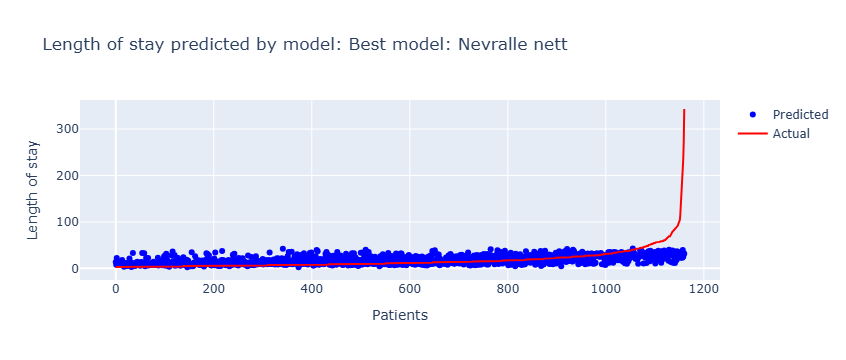

In [73]:
# Make best model
best_model = MLPRegressor(**nn_best_params).fit(final_X_train_scaled, y_train)
best_pred = best_model.predict(final_X_test_scaled)
rmse = round(mean_squared_error(best_pred, y_test)**0.5, 2)
print("RMSE best model:")
print(rmse)
visualize_predicted_los(best_pred, y_test, "Best model: Nevralle nett")

In [74]:
model_components = {
    "simple scaler" : scaler,
    "simple model" : model,
    "simple features" : features,
    
    'encoder': encoder,
    'imputer num': best_num_imputer, 
    "imputer cat" : cat_imputer,
    'scaler': final_scaler,
    "model" : best_model,
    "features" : final_X_train_scaled.columns.tolist()
}
with open('model_components.pkl', 'wb') as file:
    pickle.dump(model_components, file)